In [1]:
import pandas as pd

In [2]:
df_part5_final = pd.read_csv('data/전처리/전처리part5_final.csv', encoding='CP949')
df_part5_final 

,회사명,거래소코드,회계년도,상장일,상장폐지일,부실기업1,부실기업2,부실기업,업종,경기민감도,...,기계장비율_계산,자본집약도_계산,총자본회전률,자기자본회전률,타인자본회전률,유동자산회전률,당좌자산회전률,재고자산회전률,매출채권회전률,순운전자본회전률
0,(주)CMG제약,58820,201112,200108,NaN,0.0,0,0,제조업,1,...,19.715837,204.066667,0.66,0.984333,2.01,1.25,1.55,6.42,2.45,0.86
1,(주)CMG제약,58820,201212,200108,NaN,0.0,0,0,제조업,1,...,18.562172,425.291045,0.39,0.655130,0.93,0.52,0.57,5.71,1.85,0.42
2,(주)CMG제약,58820,201312,200108,NaN,0.0,0,0,제조업,1,...,17.604882,411.485294,0.36,0.506332,1.26,0.48,0.52,5.39,2.07,0.42
3,(주)CMG제약,58820,201412,200108,NaN,0.0,0,0,제조업,1,...,30.445768,354.432927,0.40,0.464339,2.85,0.68,0.80,4.77,1.86,0.56
4,(주)CMG제약,58820,201512,200108,NaN,0.0,0,0,제조업,1,...,28.007199,362.769231,0.47,0.564493,2.88,0.99,1.22,5.22,2.10,0.75
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
16700,흥아해운(주),3280,201612,197606,NaN,0.0,0,0,운수 및 창고업,0,...,0.000000,1000.623142,0.95,5.113218,1.20,6.98,7.96,56.47,25.24,2.19
16701,흥아해운(주),3280,201712,197606,NaN,1.0,0,1,운수 및 창고업,0,...,0.000000,905.653637,0.93,4.964267,1.12,7.68,9.30,44.09,23.08,2.09
16702,흥아해운(주),3280,201812,197606,NaN,1.0,0,1,운수 및 창고업,0,...,0.000000,983.400754,0.91,4.550483,1.03,6.73,8.14,38.87,19.15,1.75
16703,흥아해운(주),3280,201912,197606,NaN,1.0,0,1,운수 및 창고업,0,...,0.000000,1140.268437,0.17,5.407265,0.18,1.01,1.16,7.70,4.78,0.28


### inf, -inf 값 확인

In [31]:
import numpy as np
df_part5_final[(df_part5_final == np.inf).any(axis=1)]

,회사명,거래소코드,회계년도,상장일,상장폐지일,부실기업1,부실기업2,부실기업,업종,경기민감도,...,기계장비율_계산,자본집약도_계산,총자본회전률,자기자본회전률,타인자본회전률,유동자산회전률,당좌자산회전률,재고자산회전률,매출채권회전률,순운전자본회전률


In [32]:
df_part5_final[(df_part5_final == -np.inf).any(axis=1)]

,회사명,거래소코드,회계년도,상장일,상장폐지일,부실기업1,부실기업2,부실기업,업종,경기민감도,...,기계장비율_계산,자본집약도_계산,총자본회전률,자기자본회전률,타인자본회전률,유동자산회전률,당좌자산회전률,재고자산회전률,매출채권회전률,순운전자본회전률


In [5]:
df_part5_final.isna().sum()

회사명                      0
거래소코드                    0
회계년도                     0
상장일                      0
상장폐지일                15958
부실기업1                  178
부실기업2                    0
부실기업                     0
업종                       0
경기민감도                    0
총자본증가율                   0
순이익증가율                   0
자기자본증가율                  0
매출액증가율                   0
종업원수증가율                  0
정상영업손익증가율                0
매출액정상영업이익률               0
매출액순이익률                  0
총자본순이익률                  0
총자본정상영업이익률               0
자기자본정상영업이익률              0
자기자본순이익률                 0
금융비용부담률                  0
수지비율                     0
사내유보 대 자기자본비율            0
1주당매출액                   0
1주당순이익                   0
1주당 CASH FLOW            0
1주당순자산                   0
유보율                      0
자기자본구성비율                 0
유동비율                     0
당좌비율                     0
현금비율                     0
매출채권 대 매입채무비율            0
부채비율                     0
이자보상배율                   0
C

## 이상치 제거 전 정규성 검정

### 이상치 제거 전 히스토그램

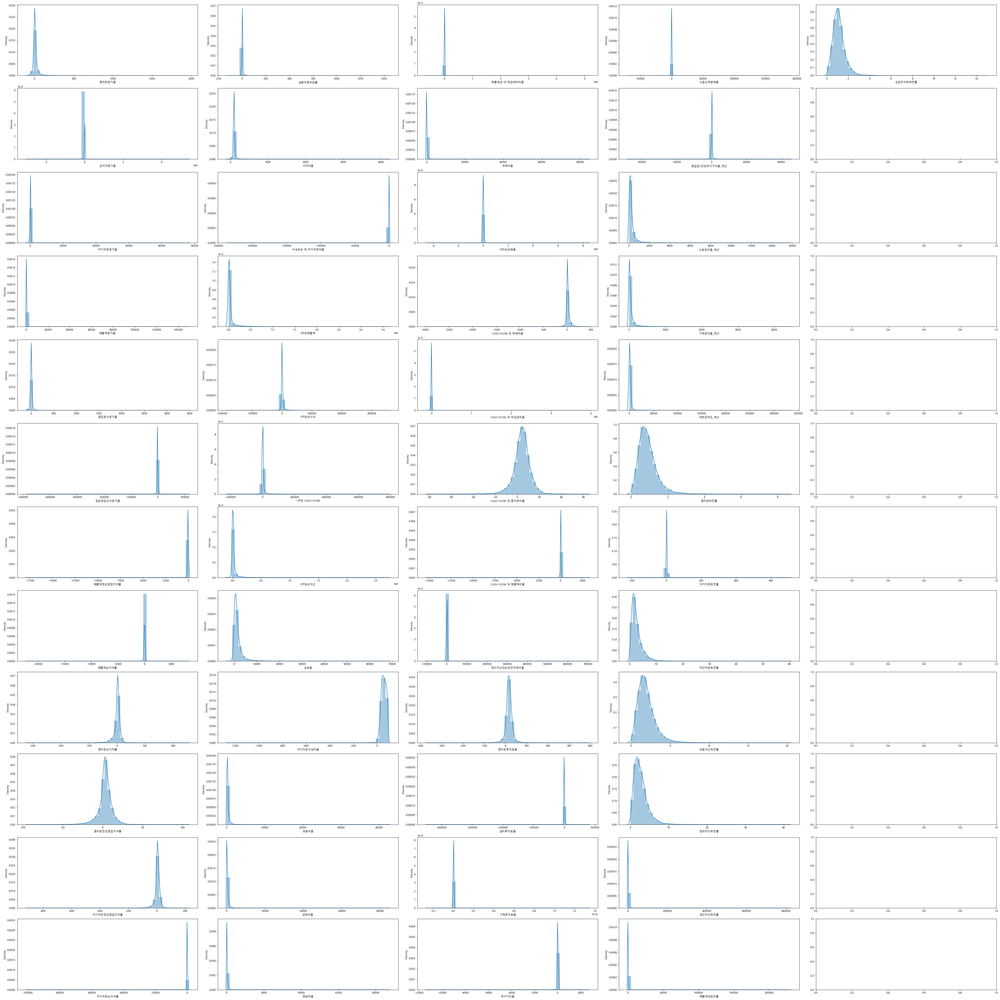

In [6]:
import seaborn as sns
import numpy as np
import warnings
warnings.filterwarnings('ignore')
import matplotlib.pyplot as plt
%matplotlib inline

plt.rcParams['axes.unicode_minus'] = False
plt.rcParams["font.family"] = "Malgun Gothic"

ncols = 5
nrows = 12

fig, axs = plt.subplots(nrows, ncols, constrained_layout=True)
fig.set_size_inches((50, 50))

for col, ax in zip(df_part5_final.columns[10:], axs.T.ravel()):
    sns.distplot(df_part5_final[col], ax=ax)

plt.show()

### 이상치 제거 전 박스플롯

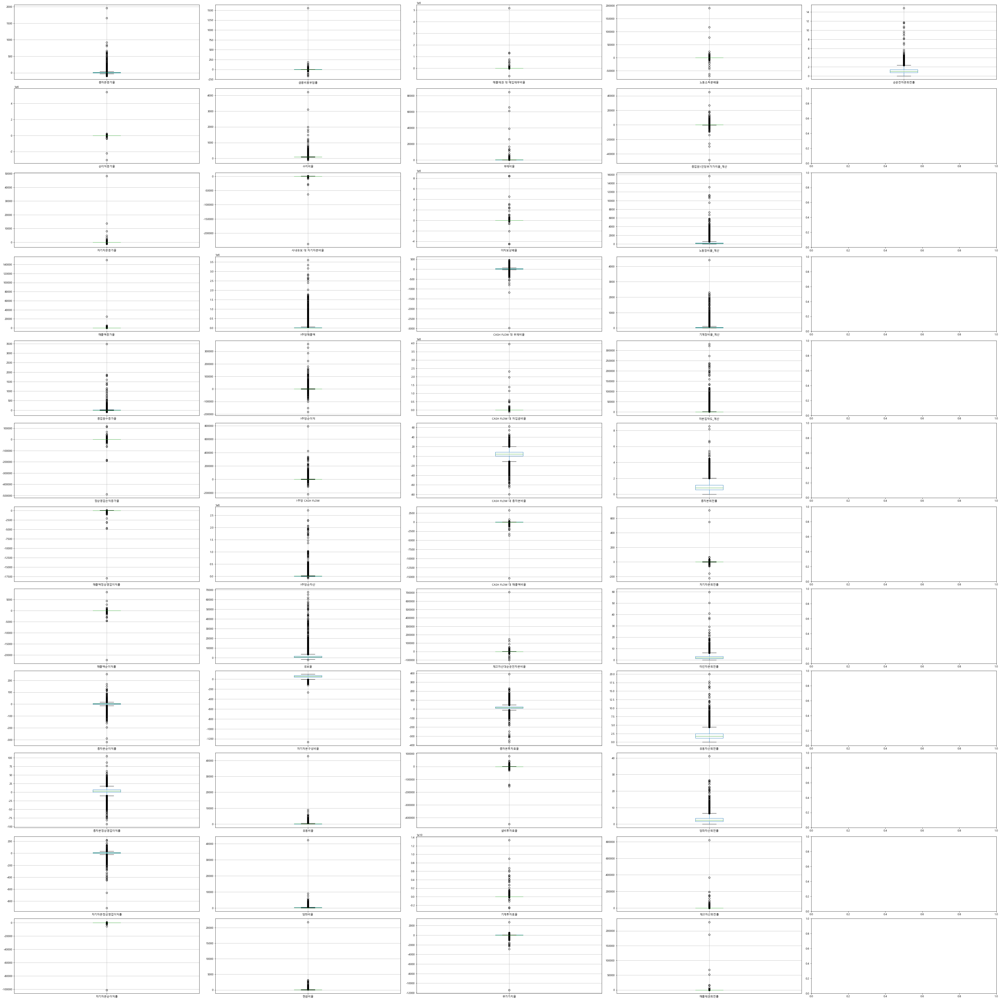

In [7]:
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

plt.rcParams['axes.unicode_minus'] = False
plt.rcParams["font.family"] = "Malgun Gothic"

ncols = 5
nrows = 12

fig, axs = plt.subplots(nrows, ncols, constrained_layout=True)
fig.set_size_inches((50, 50))

for col, ax in zip(df_part5_final.columns[10:], axs.T.ravel()):
    df_part5_final[[col]].boxplot(ax=ax)

plt.show()

### 이상치 제거 전 Q-Q Plot

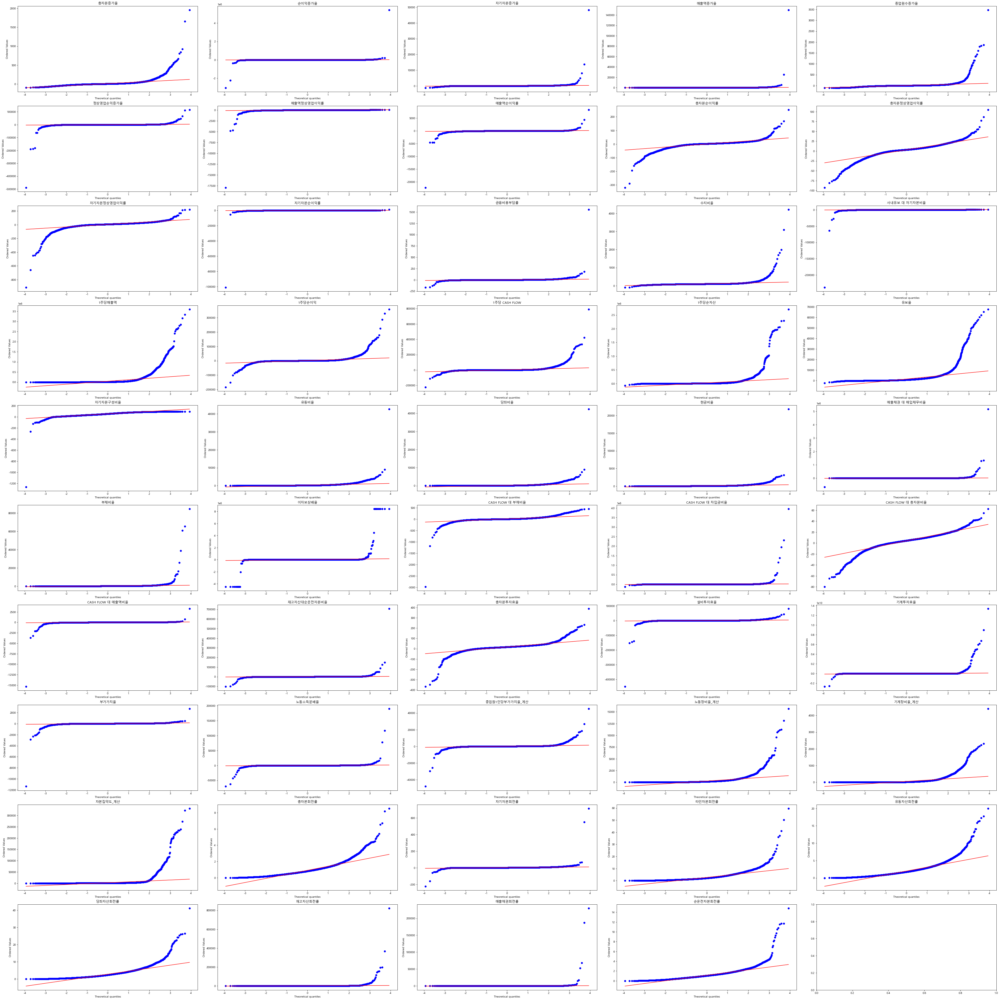

In [8]:
from scipy import stats

import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

plt.rcParams['axes.unicode_minus'] = False
plt.rcParams["font.family"] = "Malgun Gothic"

ncols = 5
nrows = 10

fig, axs = plt.subplots(nrows, ncols, constrained_layout=True)
fig.set_size_inches((50, 50))

for ax, i in zip(axs.ravel(), df_part5_final.iloc[:, 10:]):
       stats.probplot(df_part5_final[i], dist=stats.norm, plot=ax)
       ax.set_title(str(i))

plt.show()

### 이상치 제거 전 K-S Test

In [9]:
import numpy as np
from scipy.stats import kstest

def ks_test(df_name):
    ks_columns = []
    ks_columns.append([col for col in df_name])
    for i in ks_columns:
        for j in i:
            ks_test = kstest(df_name[j], 'norm')
            print(j, "의 pvalue:", ks_test.pvalue)

In [10]:
ks_test(df_part5_final.iloc[:, 10:])

총자본증가율 의 pvalue: 0.0
순이익증가율 의 pvalue: 0.0
자기자본증가율 의 pvalue: 0.0
매출액증가율 의 pvalue: 0.0
종업원수증가율 의 pvalue: 0.0
정상영업손익증가율 의 pvalue: 0.0
매출액정상영업이익률 의 pvalue: 0.0
매출액순이익률 의 pvalue: 0.0
총자본순이익률 의 pvalue: 0.0
총자본정상영업이익률 의 pvalue: 0.0
자기자본정상영업이익률 의 pvalue: 0.0
자기자본순이익률 의 pvalue: 0.0
금융비용부담률 의 pvalue: 0.0
수지비율 의 pvalue: 0.0
사내유보 대 자기자본비율 의 pvalue: 0.0
1주당매출액 의 pvalue: 0.0
1주당순이익 의 pvalue: 0.0
1주당 CASH FLOW 의 pvalue: 0.0
1주당순자산 의 pvalue: 0.0
유보율 의 pvalue: 0.0
자기자본구성비율 의 pvalue: 0.0
유동비율 의 pvalue: 0.0
당좌비율 의 pvalue: 0.0
현금비율 의 pvalue: 0.0
매출채권 대 매입채무비율 의 pvalue: 0.0
부채비율 의 pvalue: 0.0
이자보상배율 의 pvalue: 0.0
CASH FLOW 대 부채비율 의 pvalue: 0.0
CASH FLOW 대 차입금비율 의 pvalue: 0.0
CASH FLOW 대 총자본비율 의 pvalue: 0.0
CASH FLOW 대 매출액비율 의 pvalue: 0.0
재고자산대순운전자본비율 의 pvalue: 0.0
총자본투자효율 의 pvalue: 0.0
설비투자효율 의 pvalue: 0.0
기계투자효율 의 pvalue: 0.0
부가가치율 의 pvalue: 0.0
노동소득분배율 의 pvalue: 0.0
종업원1인당부가가치율_계산 의 pvalue: 0.0
노동장비율_계산 의 pvalue: 0.0
기계장비율_계산 의 pvalue: 0.0
자본집약도_계산 의 pvalue: 0.0
총자본회전률 의 pvalue: 0.0
자기자본회전률 의 pvalue: 0.0

### 이상치 제거 전 Shapiro–Wilk test

In [11]:
# pvalue 함수

from scipy import stats
from scipy.stats import shapiro

# 등락률 컬럼만 추출해서 pvalue 구하는 함수
def shap_pct(df_name):
    pct_columns = []
    pct_columns.append([col for col in df_name])
    for i in pct_columns:
        for j in i:
            shapiro_test = shapiro(df_name[j])
            print(j, "의 pvalue:", shapiro_test.pvalue)

In [12]:
# 컬럼별 pvalue 값 출력
shap_pct(df_part5_final.iloc[:, 10:])

총자본증가율 의 pvalue: 0.0
순이익증가율 의 pvalue: 0.0
자기자본증가율 의 pvalue: 0.0
매출액증가율 의 pvalue: 0.0
종업원수증가율 의 pvalue: 0.0
정상영업손익증가율 의 pvalue: 0.0
매출액정상영업이익률 의 pvalue: 0.0
매출액순이익률 의 pvalue: 0.0
총자본순이익률 의 pvalue: 0.0
총자본정상영업이익률 의 pvalue: 0.0
자기자본정상영업이익률 의 pvalue: 0.0
자기자본순이익률 의 pvalue: 0.0
금융비용부담률 의 pvalue: 0.0
수지비율 의 pvalue: 0.0
사내유보 대 자기자본비율 의 pvalue: 0.0
1주당매출액 의 pvalue: 0.0
1주당순이익 의 pvalue: 0.0
1주당 CASH FLOW 의 pvalue: 0.0
1주당순자산 의 pvalue: 0.0
유보율 의 pvalue: 0.0
자기자본구성비율 의 pvalue: 0.0
유동비율 의 pvalue: 0.0
당좌비율 의 pvalue: 0.0
현금비율 의 pvalue: 0.0
매출채권 대 매입채무비율 의 pvalue: 0.0
부채비율 의 pvalue: 0.0
이자보상배율 의 pvalue: 0.0
CASH FLOW 대 부채비율 의 pvalue: 0.0
CASH FLOW 대 차입금비율 의 pvalue: 0.0
CASH FLOW 대 총자본비율 의 pvalue: 0.0
CASH FLOW 대 매출액비율 의 pvalue: 0.0
재고자산대순운전자본비율 의 pvalue: 0.0
총자본투자효율 의 pvalue: 0.0
설비투자효율 의 pvalue: 0.0
기계투자효율 의 pvalue: 0.0
부가가치율 의 pvalue: 0.0
노동소득분배율 의 pvalue: 0.0
종업원1인당부가가치율_계산 의 pvalue: 0.0
노동장비율_계산 의 pvalue: 0.0
기계장비율_계산 의 pvalue: 0.0
자본집약도_계산 의 pvalue: 0.0
총자본회전률 의 pvalue: 0.0
자기자본회전률 의 pvalue: 0.0

### 등분산, 이분산 확인

In [ ]:
# from scipy.stats import bartlett
from scipy.stats import levene

homosced = []
heterosced = []

lev_df = df_part5_final.iloc[:, 10:]

nc_df = df_part5_final[df_part5_final['부실기업'] ==0]  # normal company 
bc_df = df_part5_final[df_part5_final['부실기업'] ==1]  # bankrupt company

lev_sced_df = pd.DataFrame(index=['등분산성'])

for i in lev_df.columns:
    lev_sced_df[i] = ''
    
    ser_1 = nc_df[i]
    ser_2 = bc_df[i]

    lresult = np.round(levene(ser_1, ser_2)[1], 3)
    
    if lresult < 0.05:
        homosced.append(i)
        lev_sced_df.loc['등분산성', i] = '등분산'
        print(i,"pvalue", lresult,"-> 등분산")
    else:
        heterosced.append(i)
        lev_sced_df.loc['등분산성', i] = '이분산'
        print(i,"pvalue", lresult,"-> 이분산")
        
    print("**********************************************************")

총자본증가율 pvalue 0.0 -> 등분산
**********************************************************
순이익증가율 pvalue 0.111 -> 이분산
**********************************************************
자기자본증가율 pvalue 0.001 -> 등분산
**********************************************************
매출액증가율 pvalue 0.783 -> 이분산
**********************************************************
종업원수증가율 pvalue 0.0 -> 등분산
**********************************************************
정상영업손익증가율 pvalue 0.0 -> 등분산
**********************************************************
매출액정상영업이익률 pvalue 0.0 -> 등분산
**********************************************************
매출액순이익률 pvalue 0.0 -> 등분산
**********************************************************
총자본순이익률 pvalue 0.0 -> 등분산
**********************************************************
총자본정상영업이익률 pvalue 0.0 -> 등분산
**********************************************************
자기자본정상영업이익률 pvalue 0.0 -> 등분산
**********************************************************
자기자본순이익률 pvalue 0.229 -> 이분산
*********************

In [ ]:
# 피처별 등분산성 데이터프레임 생성
lev_sced_df = lev_sced_df.transpose()
lev_sced_df

,등분산성
총자본증가율,등분산
순이익증가율,이분산
자기자본증가율,등분산
매출액증가율,이분산
종업원수증가율,등분산
정상영업손익증가율,등분산
매출액정상영업이익률,등분산
매출액순이익률,등분산
총자본순이익률,등분산
총자본정상영업이익률,등분산


In [ ]:
df_part5_lev = df_part5_final.copy()
df_part5_homo = df_part5_lev.loc[:, homosced]
df_part5_hetero = df_part5_lev.loc[:, heterosced]

### 이상치 제거 전 Welch's ttest_ind

In [ ]:
import numpy as np
from scipy.stats import ttest_ind

welch_df = df_part5_final.iloc[:, 10:]

nc_df = df_part5_final.iloc[:, 10:][df_part5_final['부실기업'] ==0]  # normal company 
bc_df = df_part5_final.iloc[:, 10:][df_part5_final['부실기업'] ==1]  # bankrupt company

# 등분산성 Welch's T-test
def ttest_homo(df_name1, df_name2):
    for i in welch_df.columns:
        welch_result = ttest_ind(df_name1[i], df_name2[i], equal_var=True)
        print("등분산을 가정한", i, "의 pvalue:", np.round(welch_result.pvalue, 3))
    
        print("**********************************************************")

In [ ]:
ttest_homo(nc_df, bc_df)

등분산을 가정한 총자본증가율 의 pvalue: 0.0
**********************************************************
등분산을 가정한 순이익증가율 의 pvalue: 0.024
**********************************************************
등분산을 가정한 자기자본증가율 의 pvalue: 0.421
**********************************************************
등분산을 가정한 매출액증가율 의 pvalue: 0.212
**********************************************************
등분산을 가정한 종업원수증가율 의 pvalue: 0.0
**********************************************************
등분산을 가정한 정상영업손익증가율 의 pvalue: 0.0
**********************************************************
등분산을 가정한 매출액정상영업이익률 의 pvalue: 0.0
**********************************************************
등분산을 가정한 매출액순이익률 의 pvalue: 0.0
**********************************************************
등분산을 가정한 총자본순이익률 의 pvalue: 0.0
**********************************************************
등분산을 가정한 총자본정상영업이익률 의 pvalue: 0.0
**********************************************************
등분산을 가정한 자기자본정상영업이익률 의 pvalue: 0.0
******************************************************

In [ ]:
# 이분산성 Welch's T-test
def ttest_hetero(df_name1, df_name2):
    for i in welch_df.columns:
        welch_result = ttest_ind(df_name1[i], df_name2[i], equal_var=False)
        print("이분산을 가정한", i, "의 pvalue:", np.round(welch_result.pvalue, 3))
    
        print("**********************************************************")

In [ ]:
ttest_hetero(nc_df, bc_df)

이분산을 가정한 총자본증가율 의 pvalue: 0.0
**********************************************************
이분산을 가정한 순이익증가율 의 pvalue: 0.068
**********************************************************
이분산을 가정한 자기자본증가율 의 pvalue: 0.31
**********************************************************
이분산을 가정한 매출액증가율 의 pvalue: 0.011
**********************************************************
이분산을 가정한 종업원수증가율 의 pvalue: 0.0
**********************************************************
이분산을 가정한 정상영업손익증가율 의 pvalue: 0.008
**********************************************************
이분산을 가정한 매출액정상영업이익률 의 pvalue: 0.0
**********************************************************
이분산을 가정한 매출액순이익률 의 pvalue: 0.0
**********************************************************
이분산을 가정한 총자본순이익률 의 pvalue: 0.0
**********************************************************
이분산을 가정한 총자본정상영업이익률 의 pvalue: 0.0
**********************************************************
이분산을 가정한 자기자본정상영업이익률 의 pvalue: 0.0
*****************************************************

## 로그변환 후 정규성 검정

### 로그변환 후 히스토그램

### inf, -inf 값 확인

In [ ]:
import numpy as np

df_part5_final[df_part5_final.isin([np.inf, -np.inf]).any(axis=1)]

,회사명,거래소코드,회계년도,상장일,상장폐지일,부실기업1,부실기업2,부실기업,업종,경기민감도,...,기계장비율_계산,자본집약도_계산,총자본회전률,자기자본회전률,타인자본회전률,유동자산회전률,당좌자산회전률,재고자산회전률,매출채권회전률,순운전자본회전률


### 로그 변환

In [ ]:
log_df_part5_final = np.log1p(df_part5_final.iloc[:, 10:])

In [ ]:
log_df_part5_final[log_df_part5_final.isin([np.inf, -np.inf]).any(axis=1)]

,총자본증가율,순이익증가율,자기자본증가율,매출액증가율,종업원수증가율,정상영업손익증가율,매출액정상영업이익률,매출액순이익률,총자본순이익률,총자본정상영업이익률,...,기계장비율_계산,자본집약도_계산,총자본회전률,자기자본회전률,타인자본회전률,유동자산회전률,당좌자산회전률,재고자산회전률,매출채권회전률,순운전자본회전률
414,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,4.198370,6.365779,0.398776,0.918779,0.548121,0.652325,0.883768,1.294727,1.220830,0.398776
487,3.079087,3.828356,2.906450,3.181291,3.382015,3.190076,3.045950,2.937573,2.941804,3.050220,...,0.000000,5.278348,0.693147,0.807805,1.830980,0.951658,0.951658,10.211934,2.444085,0.806476
512,NaN,4.503399,NaN,2.131392,NaN,4.632358,1.335001,-inf,-0.430783,0.678034,...,0.250805,7.841991,0.300105,0.654544,0.438255,0.751416,0.947789,1.572774,1.693779,0.343590
594,3.210519,NaN,3.428898,NaN,1.383791,NaN,0.641854,0.530628,0.364643,0.451076,...,0.000000,5.403829,0.488580,0.552895,1.646734,0.620576,0.631272,4.088494,1.371181,0.542324
853,3.990987,NaN,NaN,2.631497,1.987874,NaN,NaN,NaN,NaN,-1.714798,...,0.000000,6.989554,0.350657,0.843261,0.476234,0.470004,0.470004,0.000000,1.706565,0.285179
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
15269,NaN,5.085120,3.037136,1.987562,-inf,3.930199,2.833213,2.531313,2.729159,3.035434,...,1.541368,5.842399,0.806476,1.244837,1.252763,1.355835,1.430311,3.460095,2.352327,0.900161
15303,3.107916,4.076878,3.068862,2.516835,0.000000,2.676706,2.699346,2.833801,2.943386,2.807594,...,0.667706,6.340938,0.751416,1.066025,1.887070,1.101940,1.249902,2.447551,2.516082,0.943906
15387,NaN,NaN,NaN,0.503129,2.553344,NaN,-inf,NaN,NaN,-1.347074,...,5.348449,6.648856,0.553885,0.953729,0.858662,1.530395,1.786747,2.658159,2.078191,0.806476
15586,2.550766,NaN,2.966338,NaN,4.561636,NaN,NaN,-inf,NaN,NaN,...,0.000000,7.459095,0.760806,1.532768,1.018847,1.439835,1.678964,2.587012,1.877937,0.862890


In [ ]:
import seaborn as sns
import numpy as np
import warnings
warnings.filterwarnings('ignore')
import matplotlib.pyplot as plt
%matplotlib inline

plt.rcParams['axes.unicode_minus'] = False
plt.rcParams["font.family"] = "Malgun Gothic"

ncols = 5
nrows = 12

fig, axs = plt.subplots(nrows, ncols, constrained_layout=True)
fig.set_size_inches((50, 50))

for i in log_df_part5_final.columns:
    log_df_part5_final[i] = np.log1p(log_df_part5_final[i])

for col, ax in zip(log_df_part5_final, axs.T.ravel()):
    sns.distplot(log_df_part5_final[col], ax=ax)

plt.show()

## 스케일링

### StandardScaler

In [59]:
from sklearn.preprocessing import StandardScaler

sscaler = StandardScaler()
sscaler.fit(df_part5_final.iloc[:, 10:])

scaled_df_part5 = sscaler.transform(df_part5_final.iloc[:, 10:])

scaled_df_part5 = pd.DataFrame(scaled_df_part5, columns=df_part5_final.iloc[:, 10:].columns)

In [60]:
scaled_df_part5

,총자본증가율,순이익증가율,자기자본증가율,매출액증가율,종업원수증가율,정상영업손익증가율,매출액정상영업이익률,매출액순이익률,총자본순이익률,총자본정상영업이익률,...,기계장비율_계산,자본집약도_계산,총자본회전률,자기자본회전률,타인자본회전률,유동자산회전률,당좌자산회전률,재고자산회전률,매출채권회전률,순운전자본회전률
0,0.067133,0.002414,-0.029519,0.029888,0.012931,0.264481,0.030118,-0.015227,-0.452170,-0.082945,...,-0.230565,-0.187155,-0.468207,-0.137148,-0.302440,-0.604131,-0.629299,-0.033595,-0.018977,-0.443896
1,2.344088,-0.005771,0.144608,-0.025091,-0.083962,-0.144062,-0.159454,-0.170787,-1.206700,-1.469686,...,-0.239622,-0.166922,-0.973438,-0.180200,-0.805576,-1.207868,-1.137001,-0.033686,-0.019227,-1.162590
2,-0.294877,0.046425,0.094648,0.003693,-0.043874,0.136618,0.031854,0.032442,-0.000931,-0.192040,...,-0.247137,-0.168185,-1.029575,-0.199659,-0.651840,-1.240950,-1.162904,-0.033727,-0.019135,-1.162590
3,-0.153749,-0.000048,-0.042486,-0.008172,0.299475,0.000030,0.019379,0.028801,-0.018685,-0.261770,...,-0.146328,-0.173403,-0.954726,-0.205150,0.088888,-1.075542,-1.017847,-0.033807,-0.019223,-0.933915
4,-0.307947,-0.045894,-0.053667,-0.001954,-0.158384,-0.128837,-0.054250,-0.039182,-0.510609,-0.854481,...,-0.165472,-0.172640,-0.823740,-0.192053,0.102864,-0.819160,-0.800260,-0.033749,-0.019123,-0.623569
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
16700,0.254907,-0.004252,-0.014595,-0.019284,0.214627,-0.005660,0.011469,0.015626,-0.184386,-0.274142,...,-0.385346,-0.114303,0.074448,0.402805,-0.679792,4.134795,2.691483,-0.027180,-0.009473,1.728522
16701,-0.516404,-0.005507,-0.140284,-0.017465,-0.110747,-0.056187,-0.003192,-0.016616,-0.640802,-0.512576,...,-0.385346,-0.122989,0.037023,0.383326,-0.717061,4.713722,3.385687,-0.028766,-0.010373,1.565182
16702,-0.371689,0.000512,-0.135658,-0.026314,-0.314599,-0.028865,-0.025184,-0.029504,-0.813900,-0.861230,...,-0.385346,-0.115878,-0.000401,0.329214,-0.758989,3.928036,2.784734,-0.029436,-0.012012,1.009827
16703,-1.345434,0.001645,-0.186220,-0.091258,-1.102685,0.022514,-0.070905,-0.215343,-0.654857,-0.574434,...,-0.385346,-0.101531,-1.385108,0.441259,-1.154976,-0.802620,-0.831344,-0.033431,-0.018005,-1.391266


### StandardScaler 히스토그램

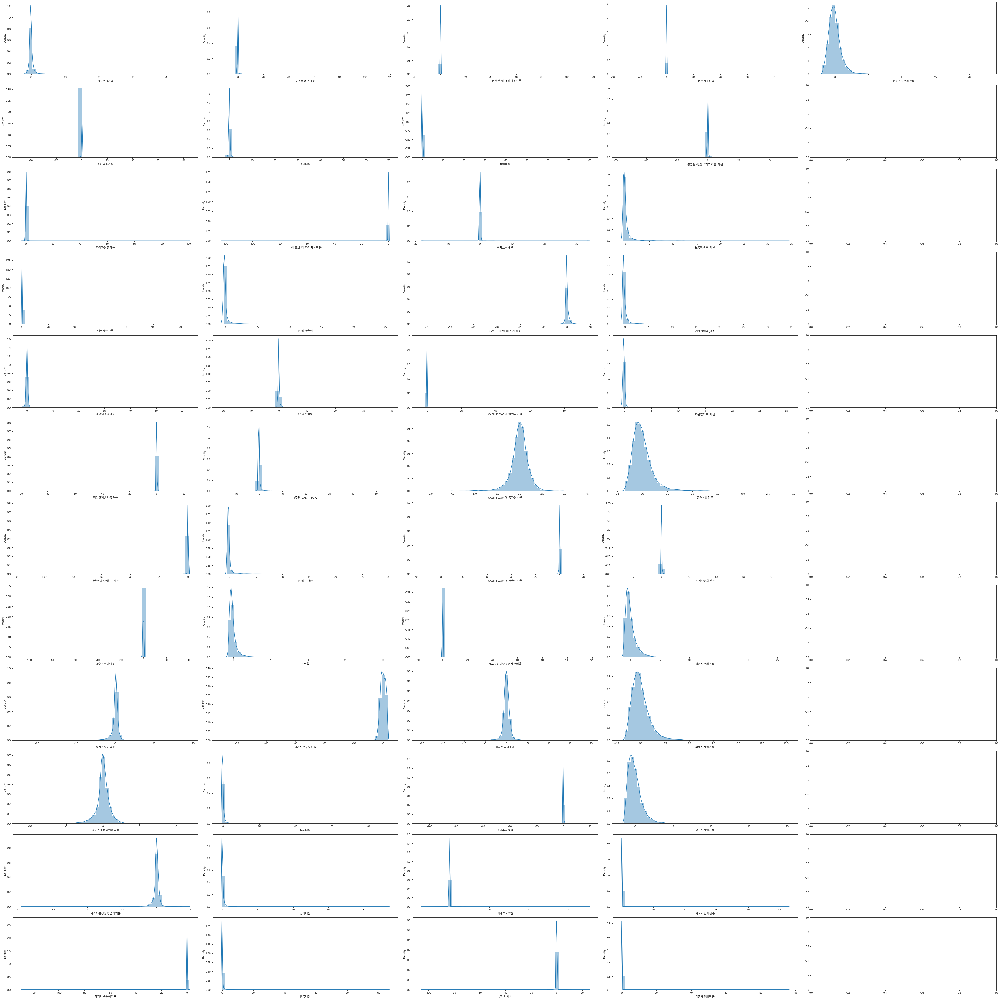

In [61]:
import seaborn as sns
import numpy as np
import warnings
warnings.filterwarnings('ignore')
import matplotlib.pyplot as plt
%matplotlib inline

plt.rcParams['axes.unicode_minus'] = False
plt.rcParams["font.family"] = "Malgun Gothic"

ncols = 5
nrows = 12

fig, axs = plt.subplots(nrows, ncols, constrained_layout=True)
fig.set_size_inches((50, 50))

for col, ax in zip(scaled_df_part5, axs.T.ravel()):
    sns.distplot(scaled_df_part5[col], ax=ax)

plt.show()

### StandardScaler 박스플롯

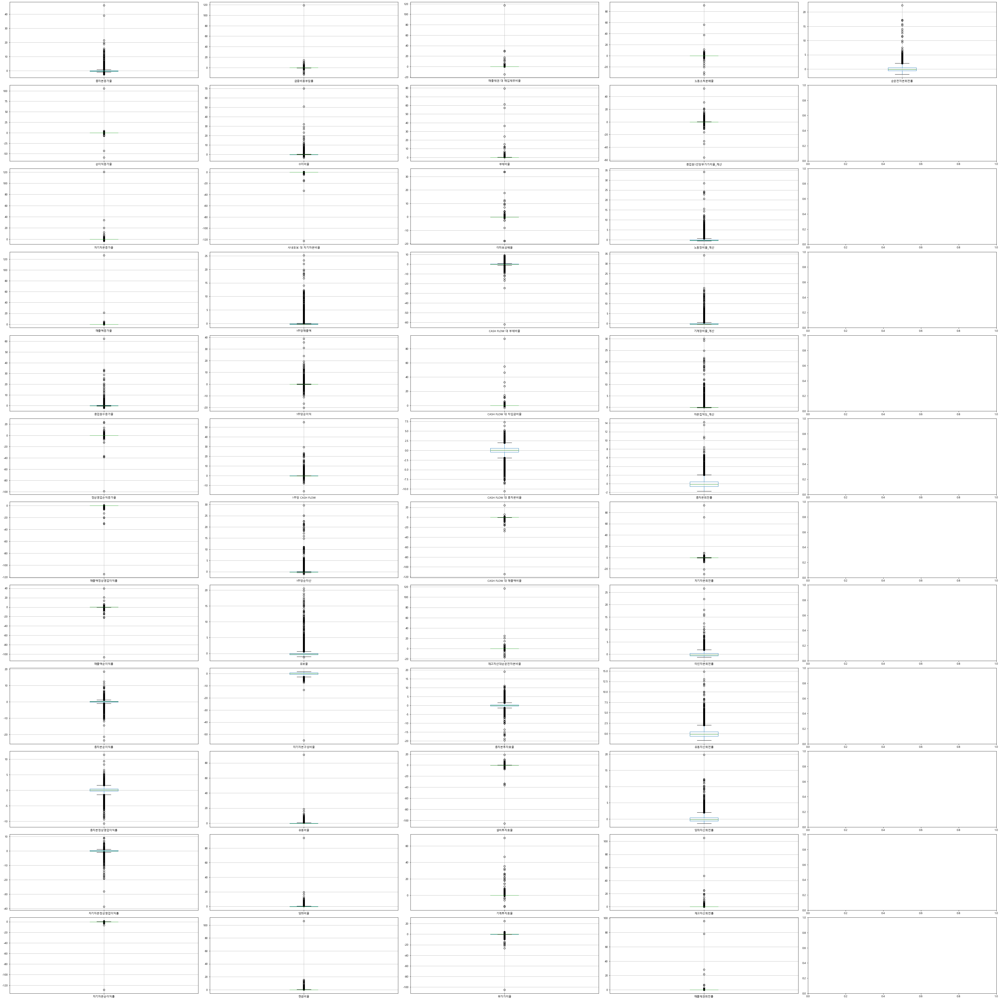

In [62]:
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

plt.rcParams['axes.unicode_minus'] = False
plt.rcParams["font.family"] = "Malgun Gothic"

ncols = 5
nrows = 12

fig, axs = plt.subplots(nrows, ncols, constrained_layout=True)
fig.set_size_inches((50, 50))

for col, ax in zip(scaled_df_part5, axs.T.ravel()):
    scaled_df_part5[[col]].boxplot(ax=ax)

plt.show()

### StandardScaler Q-Q Plot

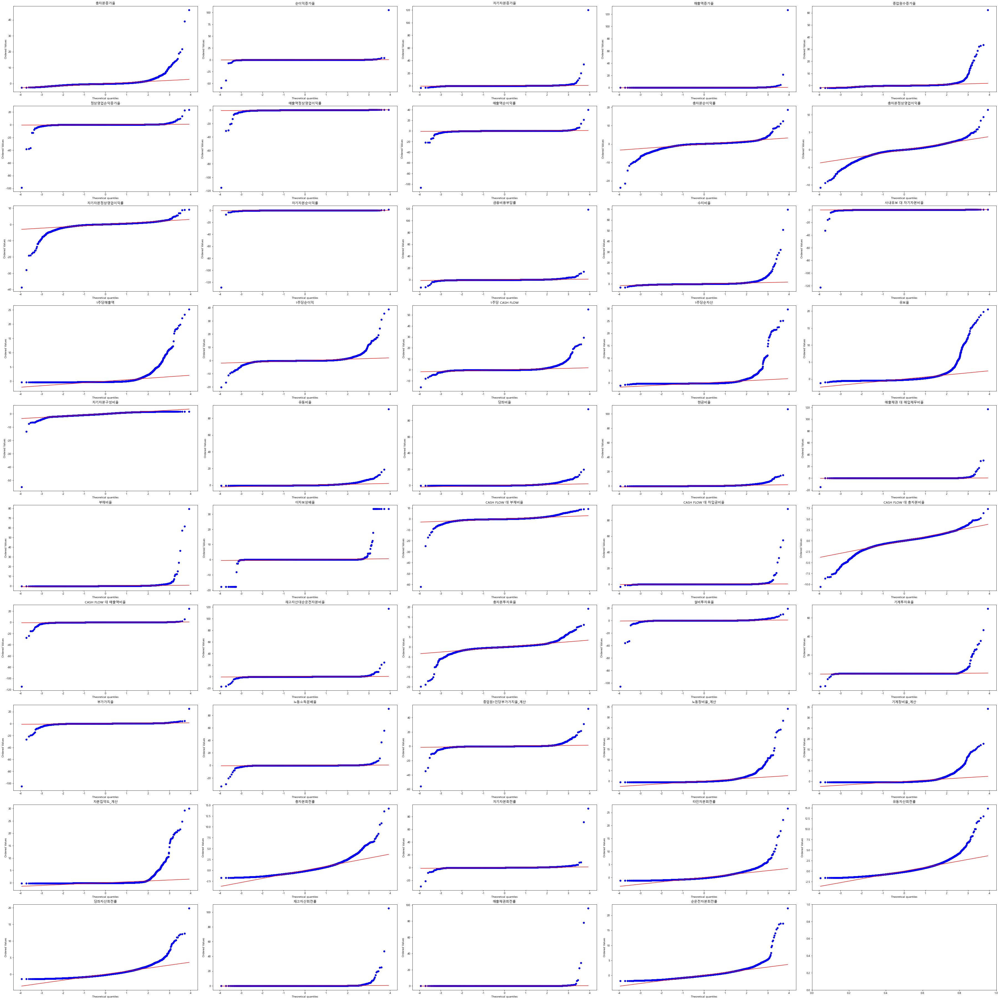

In [63]:
from scipy import stats

import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

plt.rcParams['axes.unicode_minus'] = False
plt.rcParams["font.family"] = "Malgun Gothic"

ncols = 5
nrows = 10

fig, axs = plt.subplots(nrows, ncols, constrained_layout=True)
fig.set_size_inches((50, 50))

for ax, i in zip(axs.ravel(), scaled_df_part5):
       stats.probplot(scaled_df_part5[i], dist=stats.norm, plot=ax)
       ax.set_title(str(i))

plt.show()

### StandardScaler K-S Test

In [64]:
import numpy as np
from scipy.stats import kstest

def ks_test(df_name):
    ks_columns = []
    ks_columns.append([col for col in df_name])
    for i in ks_columns:
        for j in i:
            ks_test = kstest(df_name[j], 'norm')
            print(j, "의 pvalue:", ks_test.pvalue)

In [65]:
ks_test(scaled_df_part5)

총자본증가율 의 pvalue: 0.0
순이익증가율 의 pvalue: 0.0
자기자본증가율 의 pvalue: 0.0
매출액증가율 의 pvalue: 0.0
종업원수증가율 의 pvalue: 0.0
정상영업손익증가율 의 pvalue: 0.0
매출액정상영업이익률 의 pvalue: 0.0
매출액순이익률 의 pvalue: 0.0
총자본순이익률 의 pvalue: 0.0
총자본정상영업이익률 의 pvalue: 8.362860062617889e-246
자기자본정상영업이익률 의 pvalue: 0.0
자기자본순이익률 의 pvalue: 0.0
금융비용부담률 의 pvalue: 0.0
수지비율 의 pvalue: 0.0
사내유보 대 자기자본비율 의 pvalue: 0.0
1주당매출액 의 pvalue: 0.0
1주당순이익 의 pvalue: 0.0
1주당 CASH FLOW 의 pvalue: 0.0
1주당순자산 의 pvalue: 0.0
유보율 의 pvalue: 0.0
자기자본구성비율 의 pvalue: 1.3977013717475225e-34
유동비율 의 pvalue: 0.0
당좌비율 의 pvalue: 0.0
현금비율 의 pvalue: 0.0
매출채권 대 매입채무비율 의 pvalue: 0.0
부채비율 의 pvalue: 0.0
이자보상배율 의 pvalue: 0.0
CASH FLOW 대 부채비율 의 pvalue: 0.0
CASH FLOW 대 차입금비율 의 pvalue: 0.0
CASH FLOW 대 총자본비율 의 pvalue: 3.763466918610887e-92
CASH FLOW 대 매출액비율 의 pvalue: 0.0
재고자산대순운전자본비율 의 pvalue: 0.0
총자본투자효율 의 pvalue: 6.275149036629479e-253
설비투자효율 의 pvalue: 0.0
기계투자효율 의 pvalue: 0.0
부가가치율 의 pvalue: 0.0
노동소득분배율 의 pvalue: 0.0
종업원1인당부가가치율_계산 의 pvalue: 0.0
노동장비율_계산 의 pvalue: 0.0
기계장비율_계산 의 pv

### StandardScaler Shapiro–Wilk test

In [66]:
# pvalue 함수

from scipy import stats
from scipy.stats import shapiro

# 등락률 컬럼만 추출해서 pvalue 구하는 함수
def shap_pct(df_name):
    pct_columns = []
    pct_columns.append([col for col in df_name])
    for i in pct_columns:
        for j in i:
            shapiro_test = shapiro(df_name[j])
            print(j, "의 pvalue:", shapiro_test.pvalue)

In [67]:
# 컬럼별 pvalue 값 출력
shap_pct(scaled_df_part5)

총자본증가율 의 pvalue: 0.0
순이익증가율 의 pvalue: 0.0
자기자본증가율 의 pvalue: 0.0
매출액증가율 의 pvalue: 0.0
종업원수증가율 의 pvalue: 0.0
정상영업손익증가율 의 pvalue: 0.0
매출액정상영업이익률 의 pvalue: 0.0
매출액순이익률 의 pvalue: 0.0
총자본순이익률 의 pvalue: 0.0
총자본정상영업이익률 의 pvalue: 0.0
자기자본정상영업이익률 의 pvalue: 0.0
자기자본순이익률 의 pvalue: 0.0
금융비용부담률 의 pvalue: 0.0
수지비율 의 pvalue: 0.0
사내유보 대 자기자본비율 의 pvalue: 0.0
1주당매출액 의 pvalue: 0.0
1주당순이익 의 pvalue: 0.0
1주당 CASH FLOW 의 pvalue: 0.0
1주당순자산 의 pvalue: 0.0
유보율 의 pvalue: 0.0
자기자본구성비율 의 pvalue: 0.0
유동비율 의 pvalue: 0.0
당좌비율 의 pvalue: 0.0
현금비율 의 pvalue: 0.0
매출채권 대 매입채무비율 의 pvalue: 0.0
부채비율 의 pvalue: 0.0
이자보상배율 의 pvalue: 0.0
CASH FLOW 대 부채비율 의 pvalue: 0.0
CASH FLOW 대 차입금비율 의 pvalue: 0.0
CASH FLOW 대 총자본비율 의 pvalue: 0.0
CASH FLOW 대 매출액비율 의 pvalue: 0.0
재고자산대순운전자본비율 의 pvalue: 0.0
총자본투자효율 의 pvalue: 0.0
설비투자효율 의 pvalue: 0.0
기계투자효율 의 pvalue: 0.0
부가가치율 의 pvalue: 0.0
노동소득분배율 의 pvalue: 0.0
종업원1인당부가가치율_계산 의 pvalue: 0.0
노동장비율_계산 의 pvalue: 0.0
기계장비율_계산 의 pvalue: 0.0
자본집약도_계산 의 pvalue: 0.0
총자본회전률 의 pvalue: 0.0
자기자본회전률 의 pvalue: 0.0

### 등분산, 이분산 확인

In [69]:
scaled_df_part5['부실기업'] = df_part5_final.iloc[:, 7]
scaled_df_part5.head(5)

,총자본증가율,순이익증가율,자기자본증가율,매출액증가율,종업원수증가율,정상영업손익증가율,매출액정상영업이익률,매출액순이익률,총자본순이익률,총자본정상영업이익률,...,자본집약도_계산,총자본회전률,자기자본회전률,타인자본회전률,유동자산회전률,당좌자산회전률,재고자산회전률,매출채권회전률,순운전자본회전률,부실기업
0,0.067133,0.002414,-0.029519,0.029888,0.012931,0.264481,0.030118,-0.015227,-0.452170,-0.082945,...,-0.187155,-0.468207,-0.137148,-0.302440,-0.604131,-0.629299,-0.033595,-0.018977,-0.443896,0
1,2.344088,-0.005771,0.144608,-0.025091,-0.083962,-0.144062,-0.159454,-0.170787,-1.206700,-1.469686,...,-0.166922,-0.973438,-0.180200,-0.805576,-1.207868,-1.137001,-0.033686,-0.019227,-1.162590,0
2,-0.294877,0.046425,0.094648,0.003693,-0.043874,0.136618,0.031854,0.032442,-0.000931,-0.192040,...,-0.168185,-1.029575,-0.199659,-0.651840,-1.240950,-1.162904,-0.033727,-0.019135,-1.162590,0
3,-0.153749,-0.000048,-0.042486,-0.008172,0.299475,0.000030,0.019379,0.028801,-0.018685,-0.261770,...,-0.173403,-0.954726,-0.205150,0.088888,-1.075542,-1.017847,-0.033807,-0.019223,-0.933915,0
4,-0.307947,-0.045894,-0.053667,-0.001954,-0.158384,-0.128837,-0.054250,-0.039182,-0.510609,-0.854481,...,-0.172640,-0.823740,-0.192053,0.102864,-0.819160,-0.800260,-0.033749,-0.019123,-0.623569,0


In [72]:
# from scipy.stats import bartlett
from scipy.stats import levene

homosced = []
heterosced = []

lev_df = scaled_df_part5.iloc[:, :-1]

nc_df = scaled_df_part5[scaled_df_part5['부실기업'] ==0]  # normal company 
bc_df = scaled_df_part5[scaled_df_part5['부실기업'] ==1]  # bankrupt company

lev_sced_df = pd.DataFrame(index=['등분산성'])

for i in lev_df.columns:
    lev_sced_df[i] = ''
    
    ser_1 = nc_df[i]
    ser_2 = bc_df[i]

    lresult = np.round(levene(ser_1, ser_2)[1], 3)
    
    if lresult < 0.05:
        homosced.append(i)
        lev_sced_df.loc['등분산성', i] = '등분산'
        print(i,"pvalue", lresult,"-> 등분산")
    else:
        heterosced.append(i)
        lev_sced_df.loc['등분산성', i] = '이분산'
        print(i,"pvalue", lresult,"-> 이분산")
        
    print("**********************************************************")

총자본증가율 pvalue 0.0 -> 등분산
**********************************************************
순이익증가율 pvalue 0.111 -> 이분산
**********************************************************
자기자본증가율 pvalue 0.001 -> 등분산
**********************************************************
매출액증가율 pvalue 0.783 -> 이분산
**********************************************************
종업원수증가율 pvalue 0.0 -> 등분산
**********************************************************
정상영업손익증가율 pvalue 0.0 -> 등분산
**********************************************************
매출액정상영업이익률 pvalue 0.0 -> 등분산
**********************************************************
매출액순이익률 pvalue 0.0 -> 등분산
**********************************************************
총자본순이익률 pvalue 0.0 -> 등분산
**********************************************************
총자본정상영업이익률 pvalue 0.0 -> 등분산
**********************************************************
자기자본정상영업이익률 pvalue 0.0 -> 등분산
**********************************************************
자기자본순이익률 pvalue 0.229 -> 이분산
*********************

In [73]:
# 피처별 등분산성 데이터프레임 생성
lev_sced_df = lev_sced_df.transpose()
lev_sced_df

,등분산성
총자본증가율,등분산
순이익증가율,이분산
자기자본증가율,등분산
매출액증가율,이분산
종업원수증가율,등분산
정상영업손익증가율,등분산
매출액정상영업이익률,등분산
매출액순이익률,등분산
총자본순이익률,등분산
총자본정상영업이익률,등분산


In [74]:
lev_sced_df.value_counts()

등분산성
등분산     33
이분산     16
dtype: int64

### StandardScaler Welch's ttest_ind

In [75]:
import numpy as np
from scipy.stats import ttest_ind

welch_df = scaled_df_part5.iloc[:, :-1]

nc_df = scaled_df_part5.iloc[:, :-1][scaled_df_part5['부실기업'] ==0]  # normal company 
bc_df = scaled_df_part5.iloc[:, :-1][scaled_df_part5['부실기업'] ==1]  # bankrupt company

# 등분산성 Welch's T-test
def ttest_homo(df_name1, df_name2):
    for i in welch_df.columns:
        welch_result = ttest_ind(df_name1[i], df_name2[i], equal_var=True)
        print("등분산을 가정한", i, "의 pvalue:", np.round(welch_result.pvalue, 3))
    
        print("**********************************************************")

In [76]:
ttest_homo(nc_df, bc_df)

등분산을 가정한 총자본증가율 의 pvalue: 0.0
**********************************************************
등분산을 가정한 순이익증가율 의 pvalue: 0.024
**********************************************************
등분산을 가정한 자기자본증가율 의 pvalue: 0.421
**********************************************************
등분산을 가정한 매출액증가율 의 pvalue: 0.212
**********************************************************
등분산을 가정한 종업원수증가율 의 pvalue: 0.0
**********************************************************
등분산을 가정한 정상영업손익증가율 의 pvalue: 0.0
**********************************************************
등분산을 가정한 매출액정상영업이익률 의 pvalue: 0.0
**********************************************************
등분산을 가정한 매출액순이익률 의 pvalue: 0.0
**********************************************************
등분산을 가정한 총자본순이익률 의 pvalue: 0.0
**********************************************************
등분산을 가정한 총자본정상영업이익률 의 pvalue: 0.0
**********************************************************
등분산을 가정한 자기자본정상영업이익률 의 pvalue: 0.0
******************************************************

In [77]:
# 이분산성 Welch's T-test
def ttest_hetero(df_name1, df_name2):
    for i in welch_df.columns:
        welch_result = ttest_ind(df_name1[i], df_name2[i], equal_var=False)
        print("이분산을 가정한", i, "의 pvalue:", np.round(welch_result.pvalue, 3))
    
        print("**********************************************************")

In [78]:
ttest_hetero(nc_df, bc_df)

이분산을 가정한 총자본증가율 의 pvalue: 0.0
**********************************************************
이분산을 가정한 순이익증가율 의 pvalue: 0.068
**********************************************************
이분산을 가정한 자기자본증가율 의 pvalue: 0.31
**********************************************************
이분산을 가정한 매출액증가율 의 pvalue: 0.011
**********************************************************
이분산을 가정한 종업원수증가율 의 pvalue: 0.0
**********************************************************
이분산을 가정한 정상영업손익증가율 의 pvalue: 0.008
**********************************************************
이분산을 가정한 매출액정상영업이익률 의 pvalue: 0.0
**********************************************************
이분산을 가정한 매출액순이익률 의 pvalue: 0.0
**********************************************************
이분산을 가정한 총자본순이익률 의 pvalue: 0.0
**********************************************************
이분산을 가정한 총자본정상영업이익률 의 pvalue: 0.0
**********************************************************
이분산을 가정한 자기자본정상영업이익률 의 pvalue: 0.0
*****************************************************

### MinMaxScaler

In [79]:
from sklearn.preprocessing import MinMaxScaler

mmscaler = MinMaxScaler()
mmscaler.fit(df_part5_final.iloc[:, 10:])

mmscaled_df_part5 = mmscaler.transform(df_part5_final.iloc[:, 10:])

mmscaled_df_part5 = pd.DataFrame(mmscaled_df_part5, columns=df_part5_final.iloc[:, 10:].columns)

In [80]:
mmscaled_df_part5

,총자본증가율,순이익증가율,자기자본증가율,매출액증가율,종업원수증가율,정상영업손익증가율,매출액정상영업이익률,매출액순이익률,총자본순이익률,총자본정상영업이익률,...,기계장비율_계산,자본집약도_계산,총자본회전률,자기자본회전률,타인자본회전률,유동자산회전률,당좌자산회전률,재고자산회전률,매출채권회전률,순운전자본회전률
0,0.053236,0.358996,0.024943,0.001041,0.029168,0.810103,0.995637,0.727216,0.548773,0.480975,...,0.004472,0.000586,0.077556,0.238812,0.033518,0.062563,0.037731,0.000008,0.000011,0.058030
1,0.099951,0.358946,0.026355,0.000609,0.027662,0.806761,0.993998,0.726154,0.530907,0.418503,...,0.004211,0.001255,0.045828,0.238459,0.015418,0.026026,0.013875,0.000007,0.000008,0.028340
2,0.045808,0.359264,0.025950,0.000835,0.028285,0.809057,0.995652,0.727542,0.559458,0.476060,...,0.003993,0.001213,0.042303,0.238300,0.020949,0.024024,0.012658,0.000007,0.000009,0.028340
3,0.048704,0.358981,0.024837,0.000742,0.033624,0.807940,0.995544,0.727517,0.559037,0.472919,...,0.006906,0.001041,0.047004,0.238255,0.047595,0.034034,0.019474,0.000006,0.000008,0.037787
4,0.045540,0.358702,0.024747,0.000791,0.026505,0.806885,0.994907,0.727053,0.547389,0.446218,...,0.006353,0.001066,0.055229,0.238362,0.048098,0.049550,0.029698,0.000006,0.000009,0.050607
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
16700,0.057088,0.358956,0.025064,0.000654,0.032304,0.807893,0.995475,0.727427,0.555114,0.472362,...,0.000000,0.002994,0.111633,0.243232,0.019943,0.349349,0.193768,0.000069,0.000110,0.147773
16701,0.041263,0.358948,0.024044,0.000669,0.027245,0.807480,0.995349,0.727207,0.544306,0.461620,...,0.000000,0.002707,0.109283,0.243072,0.018602,0.384384,0.226388,0.000054,0.000100,0.141026
16702,0.044232,0.358985,0.024081,0.000599,0.024076,0.807703,0.995159,0.727119,0.540208,0.445914,...,0.000000,0.002942,0.106933,0.242630,0.017094,0.336837,0.198150,0.000047,0.000083,0.118084
16703,0.024254,0.358991,0.023671,0.000088,0.011823,0.808124,0.994763,0.725850,0.543974,0.458834,...,0.000000,0.003416,0.019976,0.243547,0.002849,0.050551,0.028238,0.000009,0.000021,0.018893


### MinMaxScaler 히스토그램

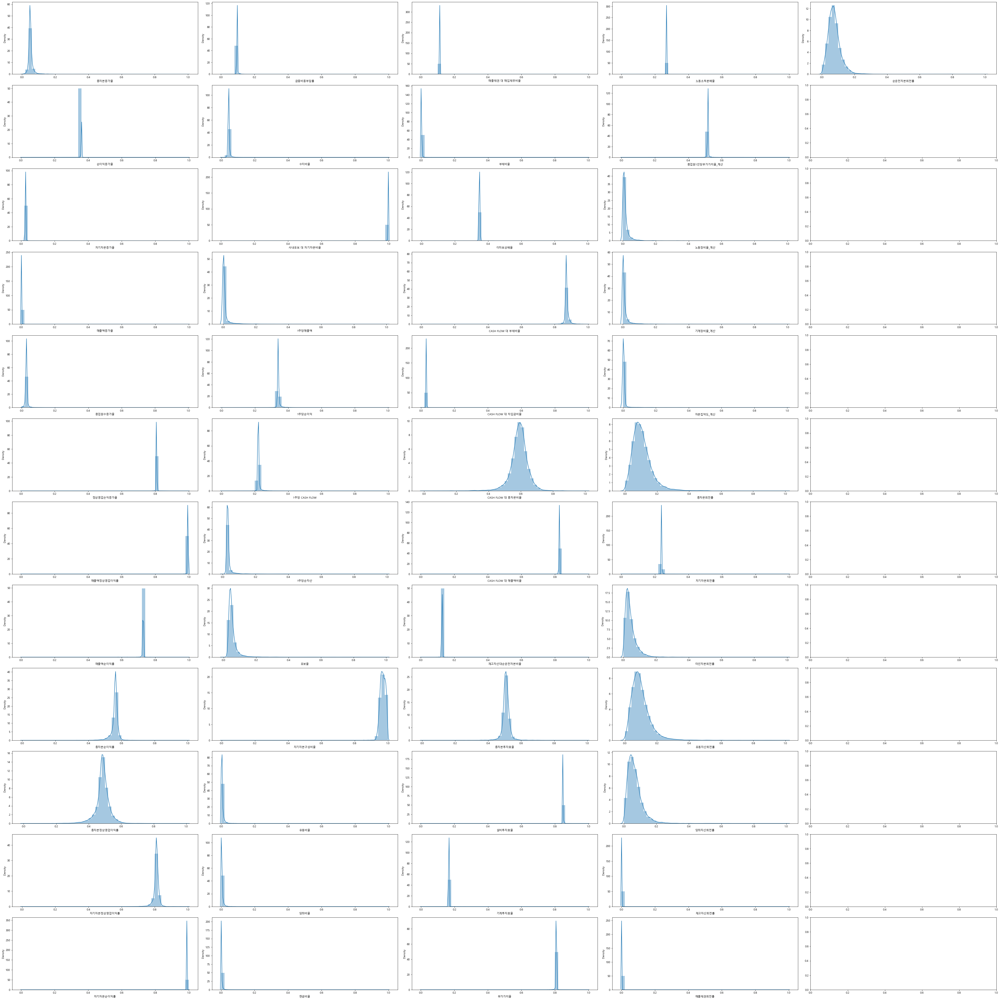

In [81]:
import seaborn as sns
import numpy as np
import warnings
warnings.filterwarnings('ignore')
import matplotlib.pyplot as plt
%matplotlib inline

plt.rcParams['axes.unicode_minus'] = False
plt.rcParams["font.family"] = "Malgun Gothic"

ncols = 5
nrows = 12

fig, axs = plt.subplots(nrows, ncols, constrained_layout=True)
fig.set_size_inches((50, 50))

for col, ax in zip(mmscaled_df_part5, axs.T.ravel()):
    sns.distplot(mmscaled_df_part5[col], ax=ax)

plt.show()

### MinMaxScaler 박스플롯

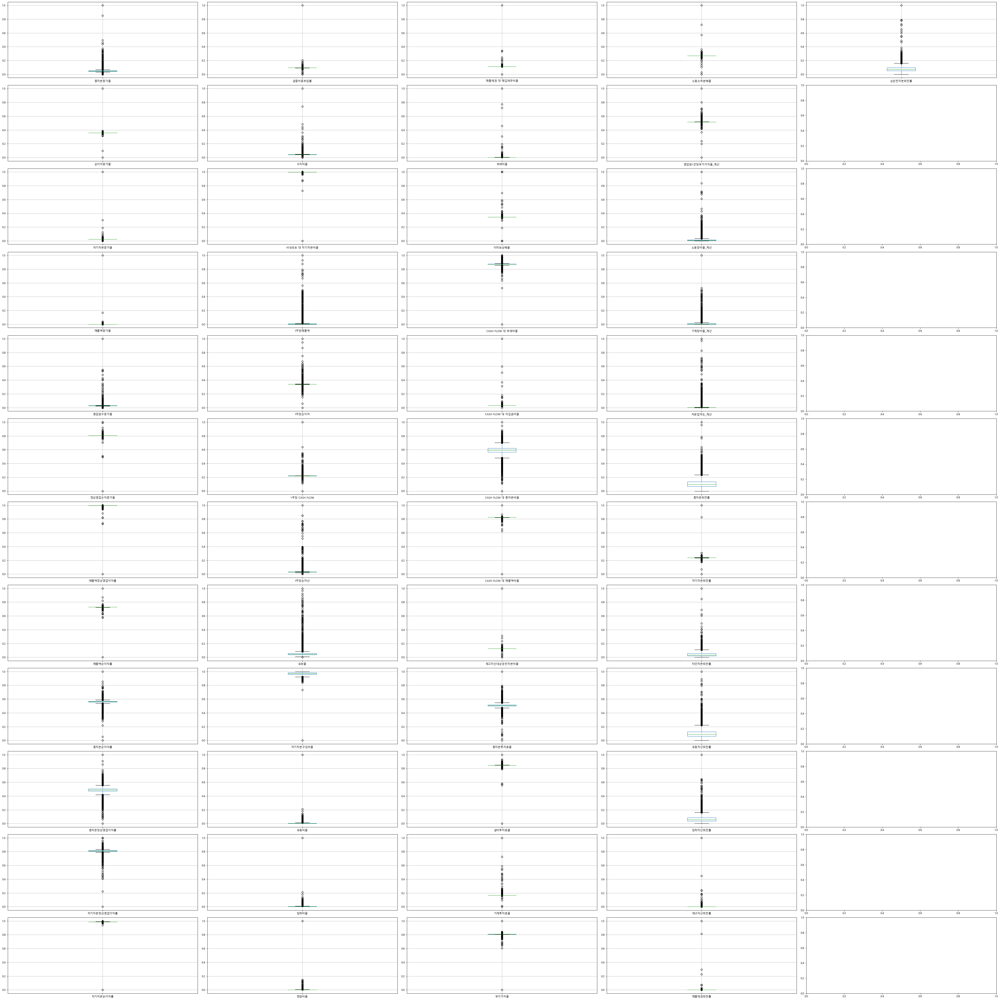

In [82]:
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

plt.rcParams['axes.unicode_minus'] = False
plt.rcParams["font.family"] = "Malgun Gothic"

ncols = 5
nrows = 12

fig, axs = plt.subplots(nrows, ncols, constrained_layout=True)
fig.set_size_inches((50, 50))

for col, ax in zip(mmscaled_df_part5, axs.T.ravel()):
    mmscaled_df_part5[[col]].boxplot(ax=ax)

plt.show()

### MinMaxScaler Q-Q Plot

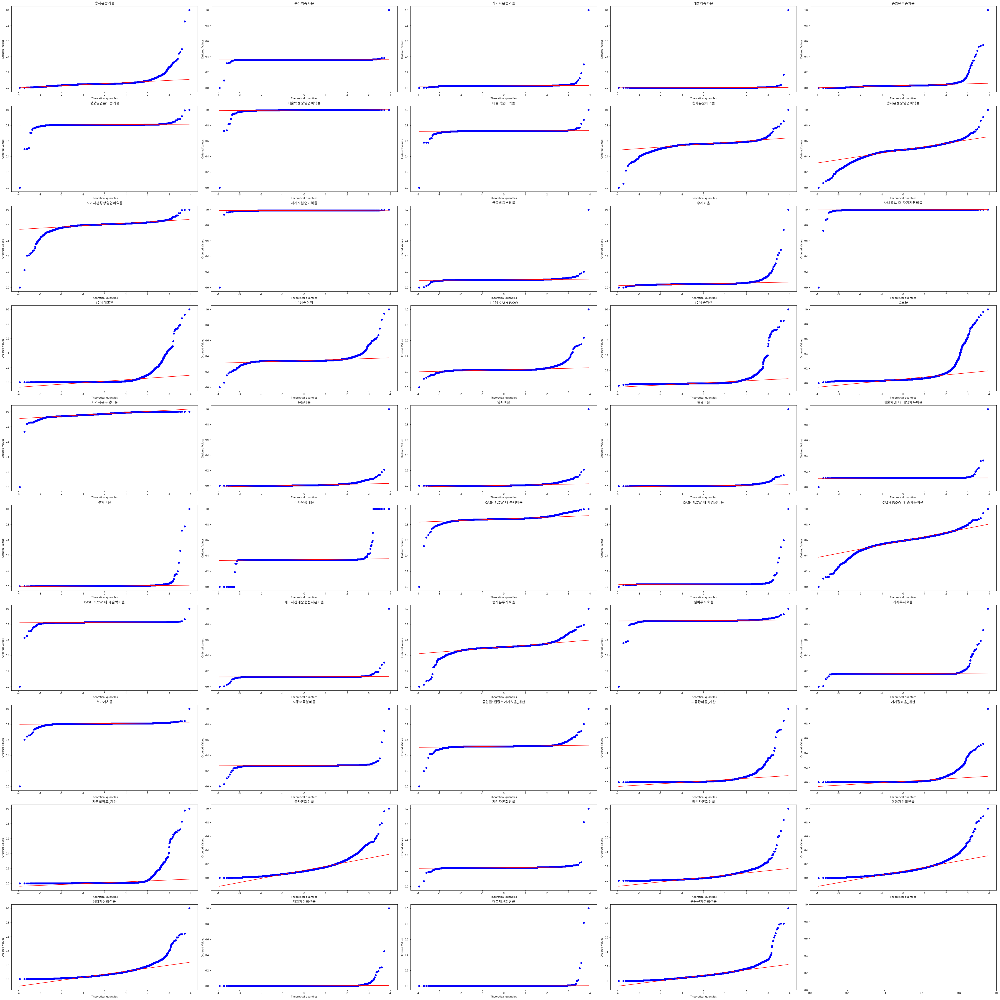

In [83]:
from scipy import stats

import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

plt.rcParams['axes.unicode_minus'] = False
plt.rcParams["font.family"] = "Malgun Gothic"

ncols = 5
nrows = 10

fig, axs = plt.subplots(nrows, ncols, constrained_layout=True)
fig.set_size_inches((50, 50))

for ax, i in zip(axs.ravel(), mmscaled_df_part5):
       stats.probplot(mmscaled_df_part5[i], dist=stats.norm, plot=ax)
       ax.set_title(str(i))

plt.show()

### MinMaxScaler K-S Test

In [ ]:
import numpy as np
from scipy.stats import kstest

def ks_test(df_name):
    ks_columns = []
    ks_columns.append([col for col in df_name])
    for i in ks_columns:
        for j in i:
            ks_test = kstest(df_name[j], 'norm')
            print(j, "의 pvalue:", ks_test.pvalue)

In [84]:
ks_test(mmscaled_df_part5)

총자본증가율 의 pvalue: 0.0
순이익증가율 의 pvalue: 0.0
자기자본증가율 의 pvalue: 0.0
매출액증가율 의 pvalue: 0.0
종업원수증가율 의 pvalue: 0.0
정상영업손익증가율 의 pvalue: 0.0
매출액정상영업이익률 의 pvalue: 0.0
매출액순이익률 의 pvalue: 0.0
총자본순이익률 의 pvalue: 0.0
총자본정상영업이익률 의 pvalue: 0.0
자기자본정상영업이익률 의 pvalue: 0.0
자기자본순이익률 의 pvalue: 0.0
금융비용부담률 의 pvalue: 0.0
수지비율 의 pvalue: 0.0
사내유보 대 자기자본비율 의 pvalue: 0.0
1주당매출액 의 pvalue: 0.0
1주당순이익 의 pvalue: 0.0
1주당 CASH FLOW 의 pvalue: 0.0
1주당순자산 의 pvalue: 0.0
유보율 의 pvalue: 0.0
자기자본구성비율 의 pvalue: 0.0
유동비율 의 pvalue: 0.0
당좌비율 의 pvalue: 0.0
현금비율 의 pvalue: 0.0
매출채권 대 매입채무비율 의 pvalue: 0.0
부채비율 의 pvalue: 0.0
이자보상배율 의 pvalue: 0.0
CASH FLOW 대 부채비율 의 pvalue: 0.0
CASH FLOW 대 차입금비율 의 pvalue: 0.0
CASH FLOW 대 총자본비율 의 pvalue: 0.0
CASH FLOW 대 매출액비율 의 pvalue: 0.0
재고자산대순운전자본비율 의 pvalue: 0.0
총자본투자효율 의 pvalue: 0.0
설비투자효율 의 pvalue: 0.0
기계투자효율 의 pvalue: 0.0
부가가치율 의 pvalue: 0.0
노동소득분배율 의 pvalue: 0.0
종업원1인당부가가치율_계산 의 pvalue: 0.0
노동장비율_계산 의 pvalue: 0.0
기계장비율_계산 의 pvalue: 0.0
자본집약도_계산 의 pvalue: 0.0
총자본회전률 의 pvalue: 0.0
자기자본회전률 의 pvalue: 0.0

### MinMaxScaler Shapiro–Wilk test

In [ ]:
# pvalue 함수

from scipy import stats
from scipy.stats import shapiro

# 등락률 컬럼만 추출해서 pvalue 구하는 함수
def shap_pct(df_name):
    pct_columns = []
    pct_columns.append([col for col in df_name])
    for i in pct_columns:
        for j in i:
            shapiro_test = shapiro(df_name[j])
            print(j, "의 pvalue:", shapiro_test.pvalue)

In [85]:
# 컬럼별 pvalue 값 출력
shap_pct(mmscaled_df_part5)

총자본증가율 의 pvalue: 0.0
순이익증가율 의 pvalue: 0.0
자기자본증가율 의 pvalue: 0.0
매출액증가율 의 pvalue: 0.0
종업원수증가율 의 pvalue: 0.0
정상영업손익증가율 의 pvalue: 0.0
매출액정상영업이익률 의 pvalue: 0.0
매출액순이익률 의 pvalue: 0.0
총자본순이익률 의 pvalue: 0.0
총자본정상영업이익률 의 pvalue: 0.0
자기자본정상영업이익률 의 pvalue: 0.0
자기자본순이익률 의 pvalue: 0.0
금융비용부담률 의 pvalue: 0.0
수지비율 의 pvalue: 0.0
사내유보 대 자기자본비율 의 pvalue: 0.0
1주당매출액 의 pvalue: 0.0
1주당순이익 의 pvalue: 0.0
1주당 CASH FLOW 의 pvalue: 0.0
1주당순자산 의 pvalue: 0.0
유보율 의 pvalue: 0.0
자기자본구성비율 의 pvalue: 0.0
유동비율 의 pvalue: 0.0
당좌비율 의 pvalue: 0.0
현금비율 의 pvalue: 0.0
매출채권 대 매입채무비율 의 pvalue: 0.0
부채비율 의 pvalue: 0.0
이자보상배율 의 pvalue: 0.0
CASH FLOW 대 부채비율 의 pvalue: 0.0
CASH FLOW 대 차입금비율 의 pvalue: 0.0
CASH FLOW 대 총자본비율 의 pvalue: 0.0
CASH FLOW 대 매출액비율 의 pvalue: 0.0
재고자산대순운전자본비율 의 pvalue: 0.0
총자본투자효율 의 pvalue: 0.0
설비투자효율 의 pvalue: 0.0
기계투자효율 의 pvalue: 0.0
부가가치율 의 pvalue: 0.0
노동소득분배율 의 pvalue: 0.0
종업원1인당부가가치율_계산 의 pvalue: 0.0
노동장비율_계산 의 pvalue: 0.0
기계장비율_계산 의 pvalue: 0.0
자본집약도_계산 의 pvalue: 0.0
총자본회전률 의 pvalue: 0.0
자기자본회전률 의 pvalue: 0.0

### 등분산, 이분산 확인

In [86]:
mmscaled_df_part5['부실기업'] = df_part5_final.iloc[:, 7]
mmscaled_df_part5.head(5)

,총자본증가율,순이익증가율,자기자본증가율,매출액증가율,종업원수증가율,정상영업손익증가율,매출액정상영업이익률,매출액순이익률,총자본순이익률,총자본정상영업이익률,...,자본집약도_계산,총자본회전률,자기자본회전률,타인자본회전률,유동자산회전률,당좌자산회전률,재고자산회전률,매출채권회전률,순운전자본회전률,부실기업
0,0.053236,0.358996,0.024943,0.001041,0.029168,0.810103,0.995637,0.727216,0.548773,0.480975,...,0.000586,0.077556,0.238812,0.033518,0.062563,0.037731,0.000008,0.000011,0.058030,0
1,0.099951,0.358946,0.026355,0.000609,0.027662,0.806761,0.993998,0.726154,0.530907,0.418503,...,0.001255,0.045828,0.238459,0.015418,0.026026,0.013875,0.000007,0.000008,0.028340,0
2,0.045808,0.359264,0.025950,0.000835,0.028285,0.809057,0.995652,0.727542,0.559458,0.476060,...,0.001213,0.042303,0.238300,0.020949,0.024024,0.012658,0.000007,0.000009,0.028340,0
3,0.048704,0.358981,0.024837,0.000742,0.033624,0.807940,0.995544,0.727517,0.559037,0.472919,...,0.001041,0.047004,0.238255,0.047595,0.034034,0.019474,0.000006,0.000008,0.037787,0
4,0.045540,0.358702,0.024747,0.000791,0.026505,0.806885,0.994907,0.727053,0.547389,0.446218,...,0.001066,0.055229,0.238362,0.048098,0.049550,0.029698,0.000006,0.000009,0.050607,0


In [87]:
# from scipy.stats import bartlett
from scipy.stats import levene

homosced = []
heterosced = []

lev_df = mmscaled_df_part5.iloc[:, :-1]

nc_df = mmscaled_df_part5[mmscaled_df_part5['부실기업'] ==0]  # normal company 
bc_df = mmscaled_df_part5[mmscaled_df_part5['부실기업'] ==1]  # bankrupt company

lev_sced_df = pd.DataFrame(index=['등분산성'])

for i in lev_df.columns:
    lev_sced_df[i] = ''
    
    ser_1 = nc_df[i]
    ser_2 = bc_df[i]

    lresult = np.round(levene(ser_1, ser_2)[1], 3)
    
    if lresult < 0.05:
        homosced.append(i)
        lev_sced_df.loc['등분산성', i] = '등분산'
        print(i,"pvalue", lresult,"-> 등분산")
    else:
        heterosced.append(i)
        lev_sced_df.loc['등분산성', i] = '이분산'
        print(i,"pvalue", lresult,"-> 이분산")
        
    print("**********************************************************")

총자본증가율 pvalue 0.0 -> 등분산
**********************************************************
순이익증가율 pvalue 0.111 -> 이분산
**********************************************************
자기자본증가율 pvalue 0.001 -> 등분산
**********************************************************
매출액증가율 pvalue 0.783 -> 이분산
**********************************************************
종업원수증가율 pvalue 0.0 -> 등분산
**********************************************************
정상영업손익증가율 pvalue 0.0 -> 등분산
**********************************************************
매출액정상영업이익률 pvalue 0.0 -> 등분산
**********************************************************
매출액순이익률 pvalue 0.0 -> 등분산
**********************************************************
총자본순이익률 pvalue 0.0 -> 등분산
**********************************************************
총자본정상영업이익률 pvalue 0.0 -> 등분산
**********************************************************
자기자본정상영업이익률 pvalue 0.0 -> 등분산
**********************************************************
자기자본순이익률 pvalue 0.229 -> 이분산
*********************

In [88]:
# 피처별 등분산성 데이터프레임 생성
lev_sced_df = lev_sced_df.transpose()
lev_sced_df

,등분산성
총자본증가율,등분산
순이익증가율,이분산
자기자본증가율,등분산
매출액증가율,이분산
종업원수증가율,등분산
정상영업손익증가율,등분산
매출액정상영업이익률,등분산
매출액순이익률,등분산
총자본순이익률,등분산
총자본정상영업이익률,등분산


In [89]:
lev_sced_df.value_counts()

등분산성
등분산     33
이분산     16
dtype: int64

### MinMaxScaler Welch's ttest_ind

In [90]:
import numpy as np
from scipy.stats import ttest_ind

welch_df = mmscaled_df_part5.iloc[:, :-1]

nc_df = mmscaled_df_part5.iloc[:, :-1][mmscaled_df_part5['부실기업'] ==0]  # normal company 
bc_df = mmscaled_df_part5.iloc[:, :-1][mmscaled_df_part5['부실기업'] ==1]  # bankrupt company

# 등분산성 Welch's T-test
def ttest_homo(df_name1, df_name2):
    for i in welch_df.columns:
        welch_result = ttest_ind(df_name1[i], df_name2[i], equal_var=True)
        print("등분산을 가정한", i, "의 pvalue:", np.round(welch_result.pvalue, 3))
    
        print("**********************************************************")

In [91]:
ttest_homo(nc_df, bc_df)

등분산을 가정한 총자본증가율 의 pvalue: 0.0
**********************************************************
등분산을 가정한 순이익증가율 의 pvalue: 0.024
**********************************************************
등분산을 가정한 자기자본증가율 의 pvalue: 0.421
**********************************************************
등분산을 가정한 매출액증가율 의 pvalue: 0.212
**********************************************************
등분산을 가정한 종업원수증가율 의 pvalue: 0.0
**********************************************************
등분산을 가정한 정상영업손익증가율 의 pvalue: 0.0
**********************************************************
등분산을 가정한 매출액정상영업이익률 의 pvalue: 0.0
**********************************************************
등분산을 가정한 매출액순이익률 의 pvalue: 0.0
**********************************************************
등분산을 가정한 총자본순이익률 의 pvalue: 0.0
**********************************************************
등분산을 가정한 총자본정상영업이익률 의 pvalue: 0.0
**********************************************************
등분산을 가정한 자기자본정상영업이익률 의 pvalue: 0.0
******************************************************

In [ ]:
# 이분산성 Welch's T-test
def ttest_hetero(df_name1, df_name2):
    for i in welch_df.columns:
        welch_result = ttest_ind(df_name1[i], df_name2[i], equal_var=False)
        print("이분산을 가정한", i, "의 pvalue:", np.round(welch_result.pvalue, 3))
    
        print("**********************************************************")

In [92]:
ttest_hetero(nc_df, bc_df)

이분산을 가정한 총자본증가율 의 pvalue: 0.0
**********************************************************
이분산을 가정한 순이익증가율 의 pvalue: 0.068
**********************************************************
이분산을 가정한 자기자본증가율 의 pvalue: 0.31
**********************************************************
이분산을 가정한 매출액증가율 의 pvalue: 0.011
**********************************************************
이분산을 가정한 종업원수증가율 의 pvalue: 0.0
**********************************************************
이분산을 가정한 정상영업손익증가율 의 pvalue: 0.008
**********************************************************
이분산을 가정한 매출액정상영업이익률 의 pvalue: 0.0
**********************************************************
이분산을 가정한 매출액순이익률 의 pvalue: 0.0
**********************************************************
이분산을 가정한 총자본순이익률 의 pvalue: 0.0
**********************************************************
이분산을 가정한 총자본정상영업이익률 의 pvalue: 0.0
**********************************************************
이분산을 가정한 자기자본정상영업이익률 의 pvalue: 0.0
*****************************************************

### RobustScaler

In [95]:
from sklearn.preprocessing import RobustScaler

rbscaler = RobustScaler()
rbscaler.fit(df_part5_final.iloc[:, 10:])

rbscaled_df_part5 = rbscaler.transform(df_part5_final.iloc[:, 10:])

rbscaled_df_part5 = pd.DataFrame(rbscaled_df_part5, columns=df_part5_final.iloc[:, 10:].columns)

In [96]:
rbscaled_df_part5

,총자본증가율,순이익증가율,자기자본증가율,매출액증가율,종업원수증가율,정상영업손익증가율,매출액정상영업이익률,매출액순이익률,총자본순이익률,총자본정상영업이익률,...,기계장비율_계산,자본집약도_계산,총자본회전률,자기자본회전률,타인자본회전률,유동자산회전률,당좌자산회전률,재고자산회전률,매출채권회전률,순운전자본회전률
0,0.511325,0.613917,0.003920,2.323597,0.318979,12.127576,-0.038224,-1.220994,-1.038008,-0.155620,...,0.146751,-0.600949,-0.275862,-0.320120,-0.052885,-0.403101,-0.407767,-0.146568,-0.761134,-0.307692
1,6.113534,-2.559855,4.362167,-0.504594,-0.110845,-7.271138,-3.673243,-4.808840,-2.374836,-1.932277,...,0.122260,-0.334728,-0.741379,-0.532884,-0.572115,-0.968992,-0.883495,-0.212430,-0.882591,-0.984615
2,-0.379363,17.680015,3.111708,0.976082,0.066986,6.056272,-0.004932,-0.121547,-0.238532,-0.295389,...,0.101938,-0.351342,-0.793103,-0.629052,-0.413462,-1.000000,-0.907767,-0.242115,-0.838057,-0.984615
3,-0.032134,-0.340965,-0.320618,0.365760,1.590112,-0.429256,-0.244143,-0.205525,-0.269987,-0.384726,...,0.374536,-0.419999,-0.724138,-0.656193,0.350962,-0.844961,-0.771845,-0.299629,-0.880567,-0.769231
4,-0.411521,-18.118613,-0.600480,0.685609,-0.440989,-6.548239,-1.655980,-1.773481,-1.141547,-1.144092,...,0.322768,-0.409967,-0.603448,-0.591463,0.365385,-0.604651,-0.567961,-0.257885,-0.831984,-0.476923
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
16700,0.973322,-1.970885,0.377449,-0.205869,1.213716,-0.699476,-0.395808,-0.509392,-0.563565,-0.400576,...,-0.271794,0.357625,0.224138,2.348379,-0.442308,4.038760,2.703883,4.496289,3.852227,1.738462
16701,-0.924407,-2.457699,-2.768421,-0.112297,-0.229665,-3.098611,-0.676942,-1.253039,-1.372215,-0.706052,...,-0.271794,0.243339,0.189655,2.252112,-0.480769,4.581395,3.354369,3.347866,3.414980,1.584615
16702,-0.568352,-0.123538,-2.652638,-0.567489,-1.133971,-1.801277,-1.098644,-1.550276,-1.678899,-1.152738,...,-0.271794,0.336900,0.155172,1.984683,-0.524038,3.844961,2.791262,2.863636,2.619433,1.061538
16703,-2.964148,0.315806,-3.918173,-3.908335,-4.629984,0.638333,-1.975339,-5.836464,-1.397117,-0.785303,...,-0.271794,0.525674,-1.120690,2.538422,-0.932692,-0.589147,-0.597087,-0.027829,-0.289474,-1.200000


### RobustScaler 히스토그램

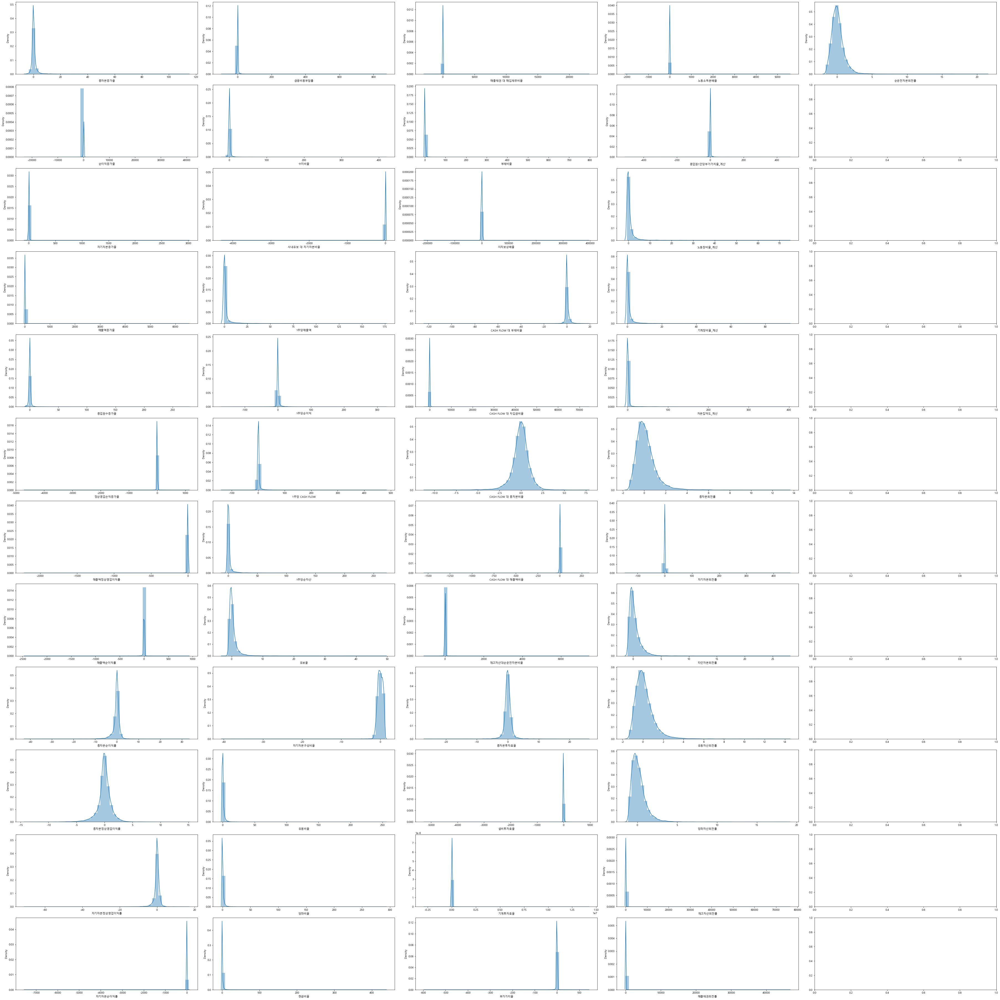

In [97]:
import seaborn as sns
import numpy as np
import warnings
warnings.filterwarnings('ignore')
import matplotlib.pyplot as plt
%matplotlib inline

plt.rcParams['axes.unicode_minus'] = False
plt.rcParams["font.family"] = "Malgun Gothic"

ncols = 5
nrows = 12

fig, axs = plt.subplots(nrows, ncols, constrained_layout=True)
fig.set_size_inches((50, 50))

for col, ax in zip(rbscaled_df_part5, axs.T.ravel()):
    sns.distplot(rbscaled_df_part5[col], ax=ax)

plt.show()

### RobustScaler 박스플롯

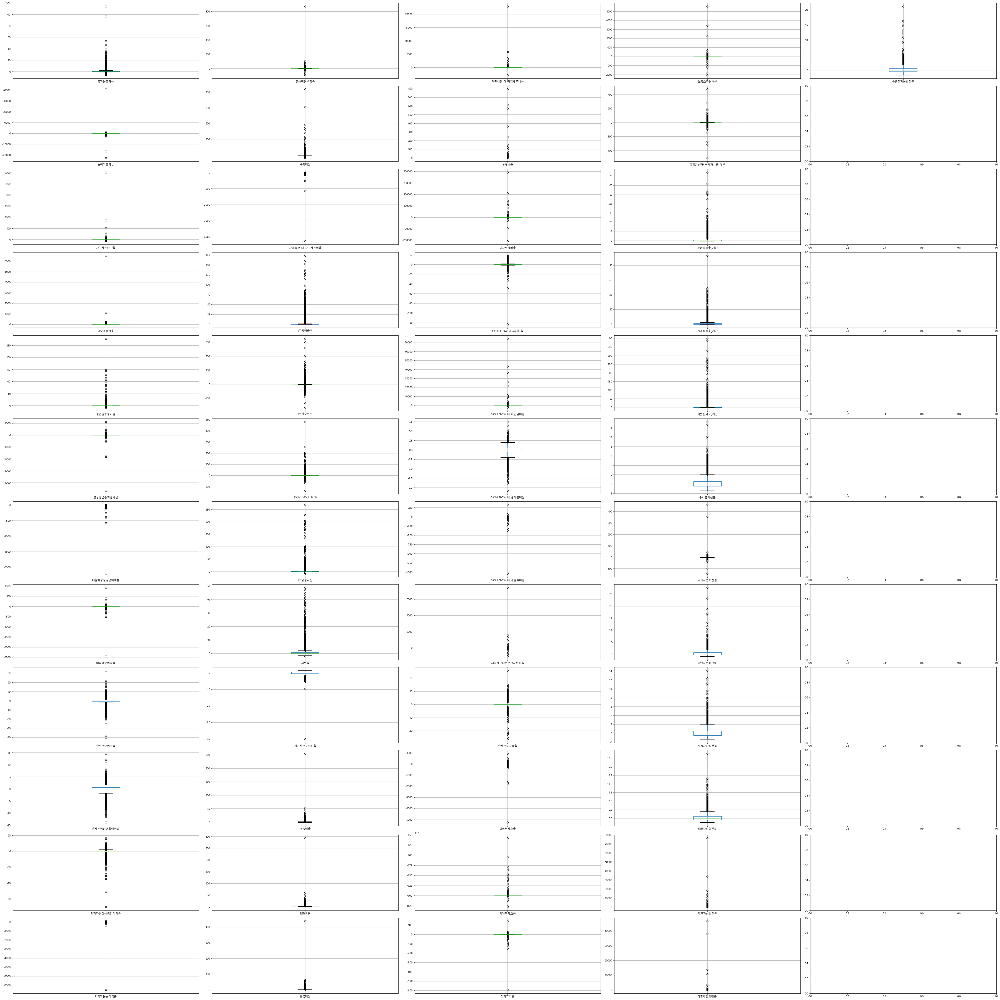

In [98]:
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

plt.rcParams['axes.unicode_minus'] = False
plt.rcParams["font.family"] = "Malgun Gothic"

ncols = 5
nrows = 12

fig, axs = plt.subplots(nrows, ncols, constrained_layout=True)
fig.set_size_inches((50, 50))

for col, ax in zip(rbscaled_df_part5, axs.T.ravel()):
    rbscaled_df_part5[[col]].boxplot(ax=ax)

plt.show()

### RobustScaler Q-Q Plot

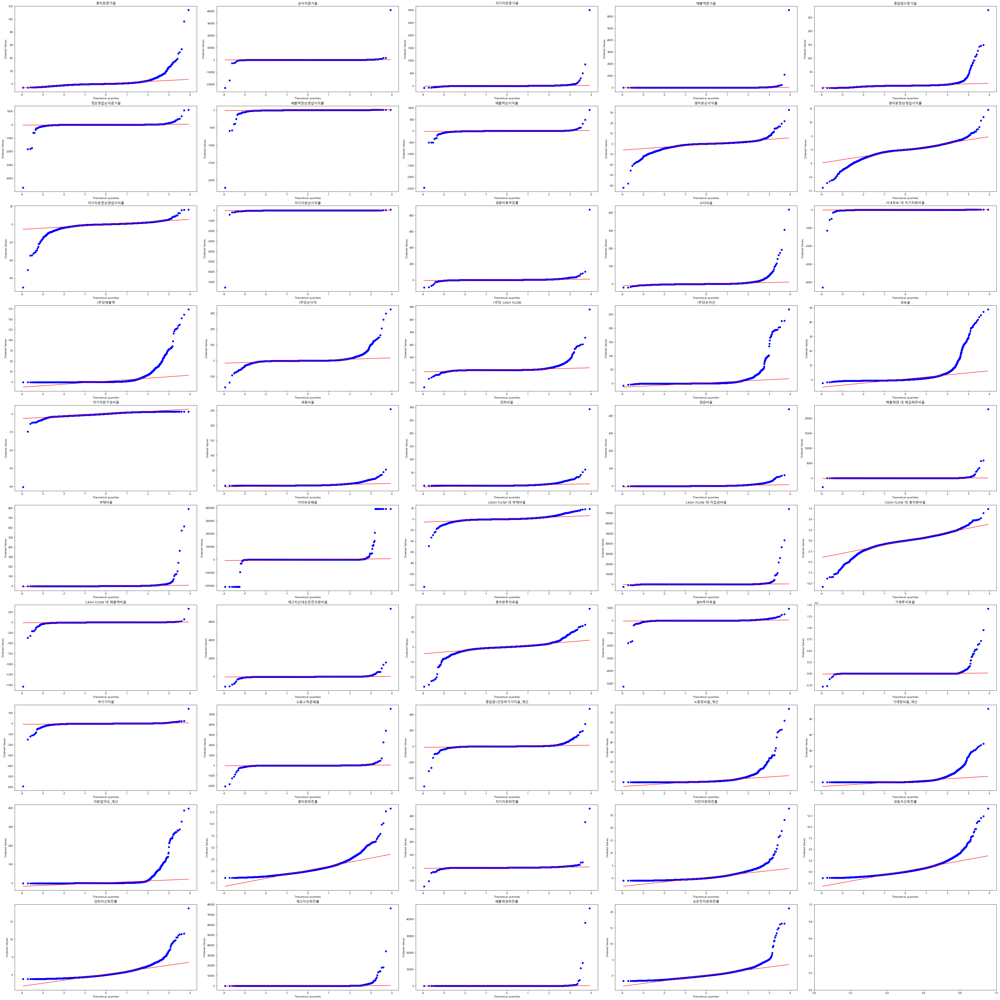

In [99]:
from scipy import stats

import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

plt.rcParams['axes.unicode_minus'] = False
plt.rcParams["font.family"] = "Malgun Gothic"

ncols = 5
nrows = 10

fig, axs = plt.subplots(nrows, ncols, constrained_layout=True)
fig.set_size_inches((50, 50))

for ax, i in zip(axs.ravel(), rbscaled_df_part5):
       stats.probplot(rbscaled_df_part5[i], dist=stats.norm, plot=ax)
       ax.set_title(str(i))

plt.show()

### RobustScaler K-S Test

In [ ]:
import numpy as np
from scipy.stats import kstest

def ks_test(df_name):
    ks_columns = []
    ks_columns.append([col for col in df_name])
    for i in ks_columns:
        for j in i:
            ks_test = kstest(df_name[j], 'norm')
            print(j, "의 pvalue:", ks_test.pvalue)

In [100]:
ks_test(rbscaled_df_part5)

총자본증가율 의 pvalue: 3.798946441263103e-139
순이익증가율 의 pvalue: 1.4188283210299963e-76
자기자본증가율 의 pvalue: 4.080325145684047e-122
매출액증가율 의 pvalue: 4.2724915052187695e-67
종업원수증가율 의 pvalue: 8.750569656464058e-104
정상영업손익증가율 의 pvalue: 1.1230218747380633e-70
매출액정상영업이익률 의 pvalue: 1.0197439380714532e-97
매출액순이익률 의 pvalue: 2.541336137967739e-125
총자본순이익률 의 pvalue: 2.838071452620317e-76
총자본정상영업이익률 의 pvalue: 3.6837607171063755e-85
자기자본정상영업이익률 의 pvalue: 1.694271759782499e-91
자기자본순이익률 의 pvalue: 1.8867150113090884e-114
금융비용부담률 의 pvalue: 1.2303307879824161e-197
수지비율 의 pvalue: 2.940680583056255e-91
사내유보 대 자기자본비율 의 pvalue: 9.890735258339824e-208
1주당매출액 의 pvalue: 0.0
1주당순이익 의 pvalue: 0.0
1주당 CASH FLOW 의 pvalue: 0.0
1주당순자산 의 pvalue: 0.0
유보율 의 pvalue: 0.0
자기자본구성비율 의 pvalue: 9.506522024911724e-202
유동비율 의 pvalue: 0.0
당좌비율 의 pvalue: 0.0
현금비율 의 pvalue: 0.0
매출채권 대 매입채무비율 의 pvalue: 0.0
부채비율 의 pvalue: 0.0
이자보상배율 의 pvalue: 0.0
CASH FLOW 대 부채비율 의 pvalue: 8.130799647551402e-218
CASH FLOW 대 차입금비율 의 pvalue: 0.0
CASH FLOW 대 총자본

### RobustScaler Shapiro–Wilk test

In [ ]:
# pvalue 함수

from scipy import stats
from scipy.stats import shapiro

# 등락률 컬럼만 추출해서 pvalue 구하는 함수
def shap_pct(df_name):
    pct_columns = []
    pct_columns.append([col for col in df_name])
    for i in pct_columns:
        for j in i:
            shapiro_test = shapiro(df_name[j])
            print(j, "의 pvalue:", shapiro_test.pvalue)

In [101]:
# 컬럼별 pvalue 값 출력
shap_pct(rbscaled_df_part5)

총자본증가율 의 pvalue: 0.0
순이익증가율 의 pvalue: 0.0
자기자본증가율 의 pvalue: 0.0
매출액증가율 의 pvalue: 0.0
종업원수증가율 의 pvalue: 0.0
정상영업손익증가율 의 pvalue: 0.0
매출액정상영업이익률 의 pvalue: 0.0
매출액순이익률 의 pvalue: 0.0
총자본순이익률 의 pvalue: 0.0
총자본정상영업이익률 의 pvalue: 0.0
자기자본정상영업이익률 의 pvalue: 0.0
자기자본순이익률 의 pvalue: 0.0
금융비용부담률 의 pvalue: 0.0
수지비율 의 pvalue: 0.0
사내유보 대 자기자본비율 의 pvalue: 0.0
1주당매출액 의 pvalue: 0.0
1주당순이익 의 pvalue: 0.0
1주당 CASH FLOW 의 pvalue: 0.0
1주당순자산 의 pvalue: 0.0
유보율 의 pvalue: 0.0
자기자본구성비율 의 pvalue: 0.0
유동비율 의 pvalue: 0.0
당좌비율 의 pvalue: 0.0
현금비율 의 pvalue: 0.0
매출채권 대 매입채무비율 의 pvalue: 0.0
부채비율 의 pvalue: 0.0
이자보상배율 의 pvalue: 0.0
CASH FLOW 대 부채비율 의 pvalue: 0.0
CASH FLOW 대 차입금비율 의 pvalue: 0.0
CASH FLOW 대 총자본비율 의 pvalue: 0.0
CASH FLOW 대 매출액비율 의 pvalue: 0.0
재고자산대순운전자본비율 의 pvalue: 0.0
총자본투자효율 의 pvalue: 0.0
설비투자효율 의 pvalue: 0.0
기계투자효율 의 pvalue: 0.0
부가가치율 의 pvalue: 0.0
노동소득분배율 의 pvalue: 0.0
종업원1인당부가가치율_계산 의 pvalue: 0.0
노동장비율_계산 의 pvalue: 0.0
기계장비율_계산 의 pvalue: 0.0
자본집약도_계산 의 pvalue: 0.0
총자본회전률 의 pvalue: 0.0
자기자본회전률 의 pvalue: 0.0

### RobustScaler 등분산, 이분산 확인

In [102]:
rbscaled_df_part5['부실기업'] = df_part5_final.iloc[:, 7]
rbscaled_df_part5.head(5)

,총자본증가율,순이익증가율,자기자본증가율,매출액증가율,종업원수증가율,정상영업손익증가율,매출액정상영업이익률,매출액순이익률,총자본순이익률,총자본정상영업이익률,...,자본집약도_계산,총자본회전률,자기자본회전률,타인자본회전률,유동자산회전률,당좌자산회전률,재고자산회전률,매출채권회전률,순운전자본회전률,부실기업
0,0.511325,0.613917,0.003920,2.323597,0.318979,12.127576,-0.038224,-1.220994,-1.038008,-0.155620,...,-0.600949,-0.275862,-0.320120,-0.052885,-0.403101,-0.407767,-0.146568,-0.761134,-0.307692,0
1,6.113534,-2.559855,4.362167,-0.504594,-0.110845,-7.271138,-3.673243,-4.808840,-2.374836,-1.932277,...,-0.334728,-0.741379,-0.532884,-0.572115,-0.968992,-0.883495,-0.212430,-0.882591,-0.984615,0
2,-0.379363,17.680015,3.111708,0.976082,0.066986,6.056272,-0.004932,-0.121547,-0.238532,-0.295389,...,-0.351342,-0.793103,-0.629052,-0.413462,-1.000000,-0.907767,-0.242115,-0.838057,-0.984615,0
3,-0.032134,-0.340965,-0.320618,0.365760,1.590112,-0.429256,-0.244143,-0.205525,-0.269987,-0.384726,...,-0.419999,-0.724138,-0.656193,0.350962,-0.844961,-0.771845,-0.299629,-0.880567,-0.769231,0
4,-0.411521,-18.118613,-0.600480,0.685609,-0.440989,-6.548239,-1.655980,-1.773481,-1.141547,-1.144092,...,-0.409967,-0.603448,-0.591463,0.365385,-0.604651,-0.567961,-0.257885,-0.831984,-0.476923,0


In [103]:
# from scipy.stats import bartlett
from scipy.stats import levene

homosced = []
heterosced = []

lev_df = rbscaled_df_part5.iloc[:, :-1]

nc_df = rbscaled_df_part5[rbscaled_df_part5['부실기업'] ==0]  # normal company 
bc_df = rbscaled_df_part5[rbscaled_df_part5['부실기업'] ==1]  # bankrupt company

lev_sced_df = pd.DataFrame(index=['등분산성'])

for i in lev_df.columns:
    lev_sced_df[i] = ''
    
    ser_1 = nc_df[i]
    ser_2 = bc_df[i]

    lresult = np.round(levene(ser_1, ser_2)[1], 3)
    
    if lresult < 0.05:
        homosced.append(i)
        lev_sced_df.loc['등분산성', i] = '등분산'
        print(i,"pvalue", lresult,"-> 등분산")
    else:
        heterosced.append(i)
        lev_sced_df.loc['등분산성', i] = '이분산'
        print(i,"pvalue", lresult,"-> 이분산")
        
    print("**********************************************************")

총자본증가율 pvalue 0.0 -> 등분산
**********************************************************
순이익증가율 pvalue 0.111 -> 이분산
**********************************************************
자기자본증가율 pvalue 0.001 -> 등분산
**********************************************************
매출액증가율 pvalue 0.783 -> 이분산
**********************************************************
종업원수증가율 pvalue 0.0 -> 등분산
**********************************************************
정상영업손익증가율 pvalue 0.0 -> 등분산
**********************************************************
매출액정상영업이익률 pvalue 0.0 -> 등분산
**********************************************************
매출액순이익률 pvalue 0.0 -> 등분산
**********************************************************
총자본순이익률 pvalue 0.0 -> 등분산
**********************************************************
총자본정상영업이익률 pvalue 0.0 -> 등분산
**********************************************************
자기자본정상영업이익률 pvalue 0.0 -> 등분산
**********************************************************
자기자본순이익률 pvalue 0.229 -> 이분산
*********************

In [104]:
# 피처별 등분산성 데이터프레임 생성
lev_sced_df = lev_sced_df.transpose()
lev_sced_df

,등분산성
총자본증가율,등분산
순이익증가율,이분산
자기자본증가율,등분산
매출액증가율,이분산
종업원수증가율,등분산
정상영업손익증가율,등분산
매출액정상영업이익률,등분산
매출액순이익률,등분산
총자본순이익률,등분산
총자본정상영업이익률,등분산


In [105]:
lev_sced_df.value_counts()

등분산성
등분산     33
이분산     16
dtype: int64

### RobustScaler Welch's ttest_ind

In [106]:
import numpy as np
from scipy.stats import ttest_ind

welch_df = rbscaled_df_part5.iloc[:, :-1]

nc_df = rbscaled_df_part5.iloc[:, :-1][rbscaled_df_part5['부실기업'] ==0]  # normal company 
bc_df = rbscaled_df_part5.iloc[:, :-1][rbscaled_df_part5['부실기업'] ==1]  # bankrupt company

# 등분산성 Welch's T-test
def ttest_homo(df_name1, df_name2):
    for i in welch_df.columns:
        welch_result = ttest_ind(df_name1[i], df_name2[i], equal_var=True)
        print("등분산을 가정한", i, "의 pvalue:", np.round(welch_result.pvalue, 3))
    
        print("**********************************************************")

In [107]:
ttest_homo(nc_df, bc_df)

등분산을 가정한 총자본증가율 의 pvalue: 0.0
**********************************************************
등분산을 가정한 순이익증가율 의 pvalue: 0.024
**********************************************************
등분산을 가정한 자기자본증가율 의 pvalue: 0.421
**********************************************************
등분산을 가정한 매출액증가율 의 pvalue: 0.212
**********************************************************
등분산을 가정한 종업원수증가율 의 pvalue: 0.0
**********************************************************
등분산을 가정한 정상영업손익증가율 의 pvalue: 0.0
**********************************************************
등분산을 가정한 매출액정상영업이익률 의 pvalue: 0.0
**********************************************************
등분산을 가정한 매출액순이익률 의 pvalue: 0.0
**********************************************************
등분산을 가정한 총자본순이익률 의 pvalue: 0.0
**********************************************************
등분산을 가정한 총자본정상영업이익률 의 pvalue: 0.0
**********************************************************
등분산을 가정한 자기자본정상영업이익률 의 pvalue: 0.0
******************************************************

In [ ]:
# 이분산성 Welch's T-test
def ttest_hetero(df_name1, df_name2):
    for i in welch_df.columns:
        welch_result = ttest_ind(df_name1[i], df_name2[i], equal_var=False)
        print("이분산을 가정한", i, "의 pvalue:", np.round(welch_result.pvalue, 3))
    
        print("**********************************************************")

In [108]:
ttest_hetero(nc_df, bc_df)

이분산을 가정한 총자본증가율 의 pvalue: 0.0
**********************************************************
이분산을 가정한 순이익증가율 의 pvalue: 0.068
**********************************************************
이분산을 가정한 자기자본증가율 의 pvalue: 0.31
**********************************************************
이분산을 가정한 매출액증가율 의 pvalue: 0.011
**********************************************************
이분산을 가정한 종업원수증가율 의 pvalue: 0.0
**********************************************************
이분산을 가정한 정상영업손익증가율 의 pvalue: 0.008
**********************************************************
이분산을 가정한 매출액정상영업이익률 의 pvalue: 0.0
**********************************************************
이분산을 가정한 매출액순이익률 의 pvalue: 0.0
**********************************************************
이분산을 가정한 총자본순이익률 의 pvalue: 0.0
**********************************************************
이분산을 가정한 총자본정상영업이익률 의 pvalue: 0.0
**********************************************************
이분산을 가정한 자기자본정상영업이익률 의 pvalue: 0.0
*****************************************************

## 이상치 제거 후 정규성 검정

### IQR

In [110]:
# 이상치 인덱스 확인

q1 = df_part5_final['총자본증가율'].quantile(0.25)
q3 = df_part5_final['총자본증가율'].quantile(0.75)
iqr = q3-q1

condition1 = df_part5_final['총자본증가율']>q3+1.5*iqr
condition2 = df_part5_final['총자본증가율']<q1-1.5*iqr
a = df_part5_final[condition1].index
b = df_part5_final[condition2].index

print(a)
print(b)

Int64Index([    1,     5,     8,    25,    28,    29,    46,    67,   100,
              130,
            ...
            16500, 16508, 16549, 16661, 16670, 16671, 16674, 16678, 16679,
            16681],
           dtype='int64', length=1298)
Int64Index([   10,    37,    43,    90,    92,    95,   104,   137,   138,
              146,
            ...
            16402, 16464, 16571, 16590, 16664, 16668, 16672, 16695, 16703,
            16704],
           dtype='int64', length=524)


In [111]:
iqr_list = ['총자본증가율', '순이익증가율', '자기자본증가율', '매출액증가율', '종업원수증가율',
       '정상영업손익증가율', '매출액정상영업이익률', '매출액순이익률', '총자본순이익률', '총자본정상영업이익률',
       '자기자본정상영업이익률', '자기자본순이익률', '금융비용부담률', '수지비율', '사내유보 대 자기자본비율', '1주당매출액',
       '1주당순이익', '1주당 CASH FLOW', '1주당순자산', '유보율', '자기자본구성비율', '유동비율', '당좌비율',
       '현금비율', '매출채권 대 매입채무비율', '부채비율', '이자보상배율', 'CASH FLOW 대 부채비율',
       'CASH FLOW 대 차입금비율', 'CASH FLOW 대 총자본비율', 'CASH FLOW 대 매출액비율',
       '재고자산대순운전자본비율', '총자본투자효율', '설비투자효율', '기계투자효율', '부가가치율', '노동소득분배율',
       '종업원1인당부가가치율_계산', '노동장비율_계산', '기계장비율_계산', '자본집약도_계산', '총자본회전률',
       '자기자본회전률', '타인자본회전률', '유동자산회전률', '당좌자산회전률', '재고자산회전률', '매출채권회전률',
       '순운전자본회전률']

In [112]:
cols = []

iqr_df = df_part5_final[iqr_list]
cols.append([col for col in iqr_df])

Q1 = iqr_df[iqr_list].quantile(q=0.25)
Q3 = iqr_df[iqr_list].quantile(q=0.75)
IQR = Q3-Q1

for i in cols:
       iqr_df[i] = iqr_df[i][(iqr_df[i] <= Q3[i]+1.5*IQR[i]) & (iqr_df[i] >= Q1[i]-1.5*IQR[i])]

### IQR 히스토그램

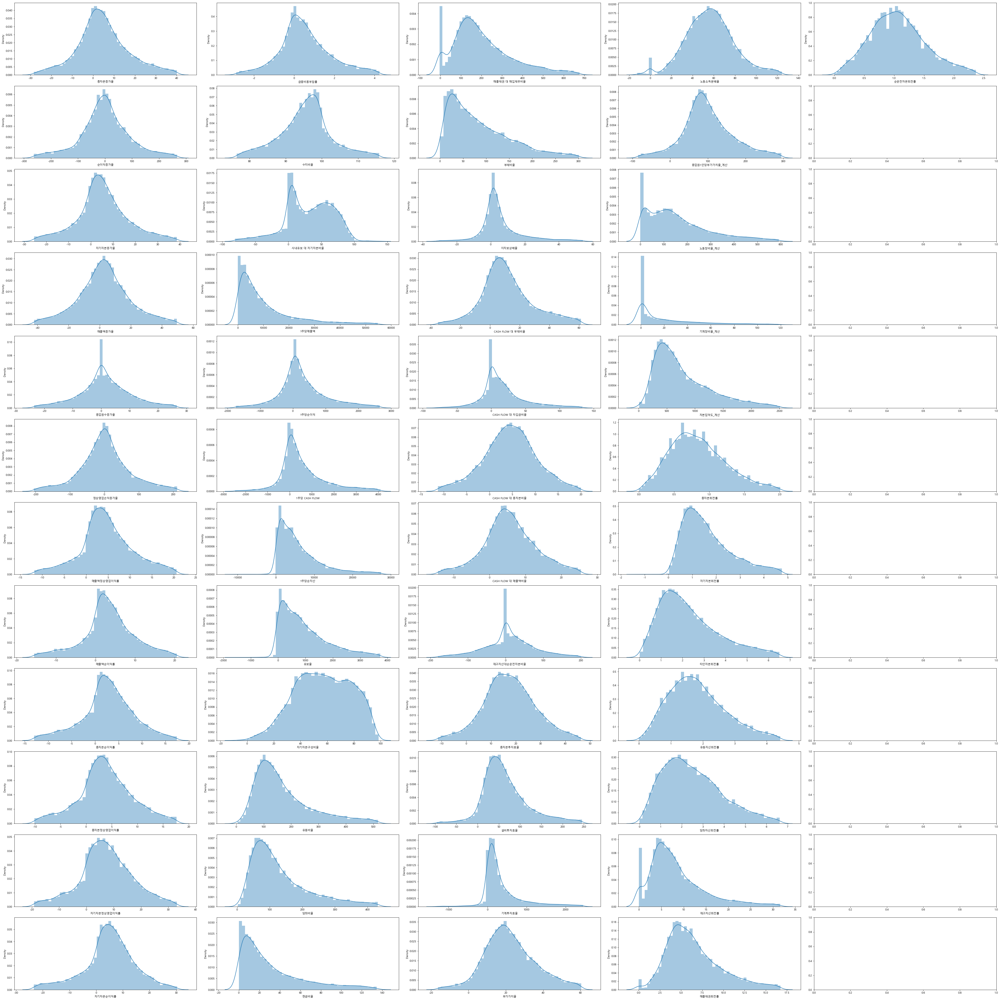

In [113]:
import numpy as np
import warnings
warnings.filterwarnings('ignore')
import matplotlib.pyplot as plt
%matplotlib inline

plt.rcParams['axes.unicode_minus'] = False
plt.rcParams["font.family"] = "Malgun Gothic"

ncols = 5
nrows = 12

fig, axs = plt.subplots(nrows, ncols, constrained_layout=True)
fig.set_size_inches((50, 50))

for col, ax in zip(iqr_df, axs.T.ravel()):
    sns.distplot(iqr_df[col], ax=ax)

plt.show()

### IQR 박스플롯

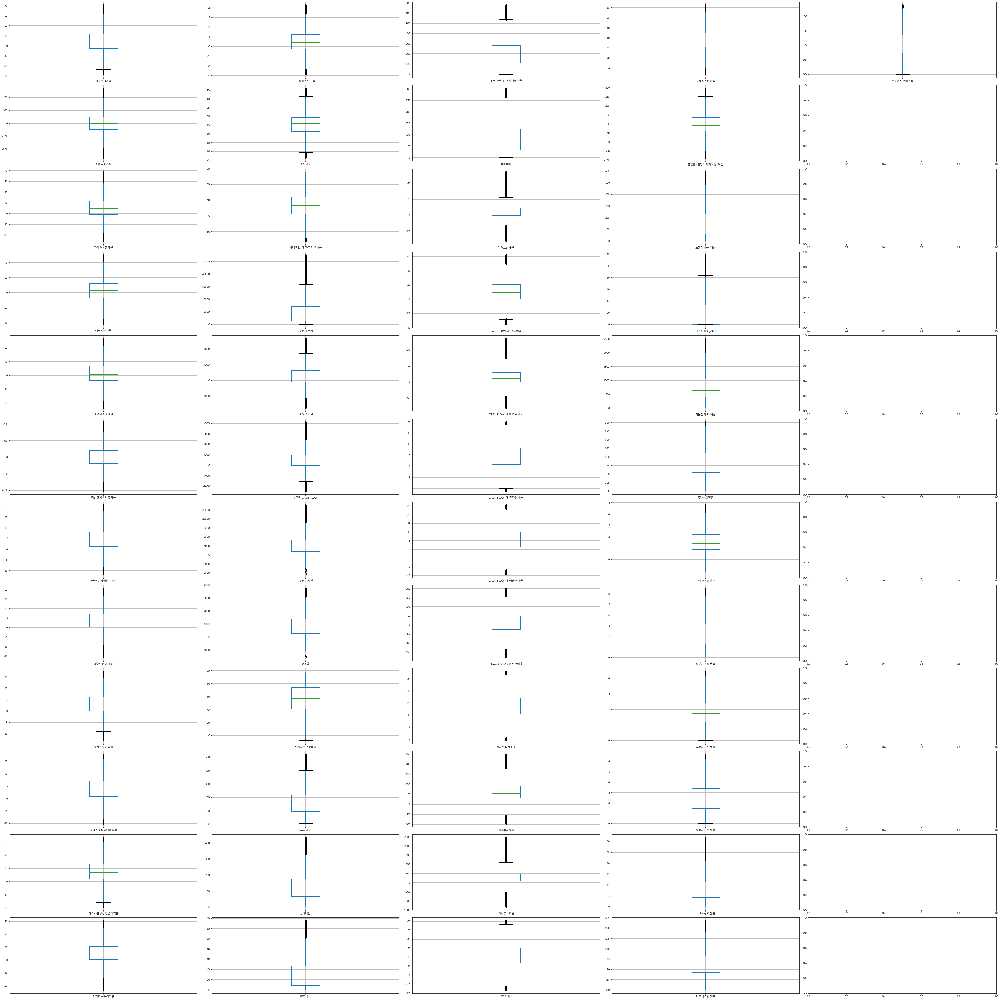

In [114]:
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

plt.rcParams['axes.unicode_minus'] = False
plt.rcParams["font.family"] = "Malgun Gothic"

ncols = 5
nrows = 12

fig, axs = plt.subplots(nrows, ncols, constrained_layout=True)
fig.set_size_inches((50, 50))

for col, ax in zip(iqr_df.columns, axs.T.ravel()):
    iqr_df[[col]].boxplot(ax=ax)

plt.show()

### IQR Q-Q Plot

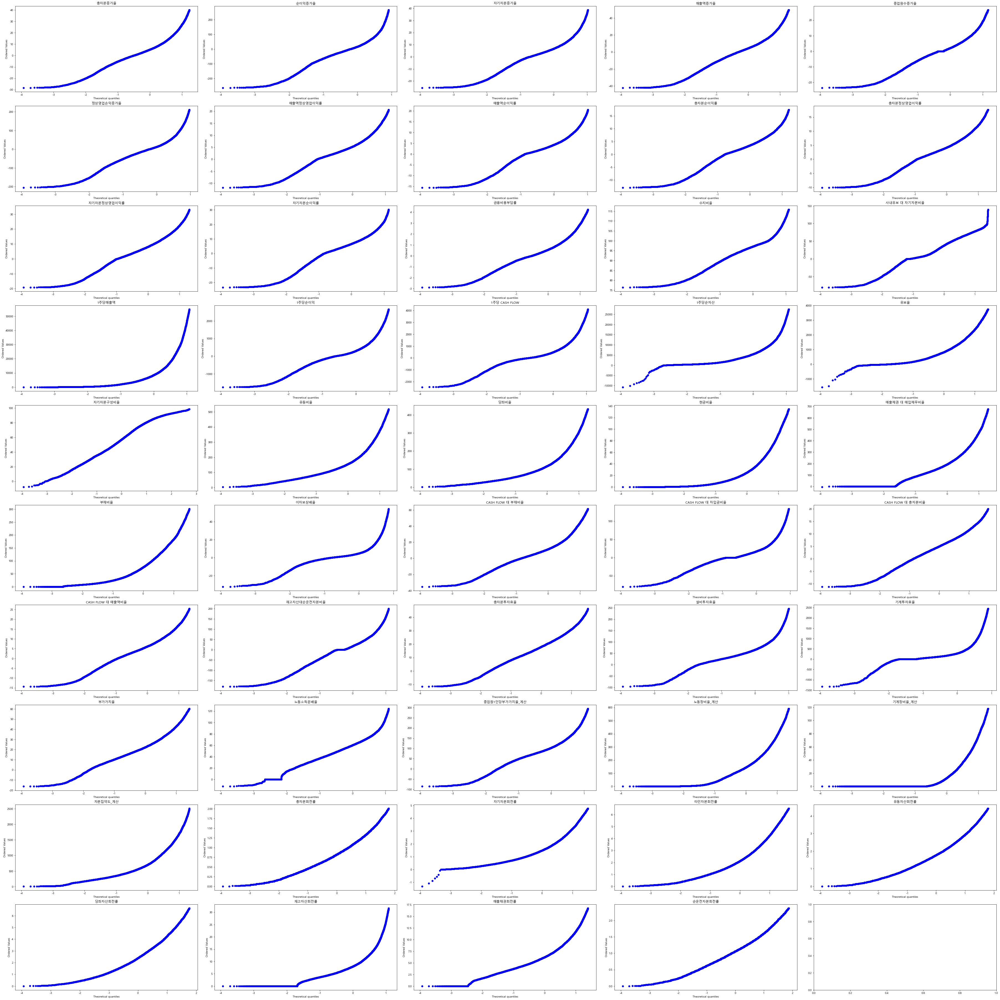

In [115]:
from scipy import stats

import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

plt.rcParams['axes.unicode_minus'] = False
plt.rcParams["font.family"] = "Malgun Gothic"

ncols = 5
nrows = 10

fig, axs = plt.subplots(nrows, ncols, constrained_layout=True)
fig.set_size_inches((50, 50))

for ax, i in zip(axs.ravel(), iqr_df):
        stats.probplot(iqr_df[i], dist='norm', plot=ax)
        ax.set_title(str(i))

plt.show()

### IQR K-S Test

In [ ]:
import numpy as np
from scipy.stats import kstest

def ks_test(df_name):
    ks_columns = []
    ks_columns.append([col for col in df_name])
    for i in ks_columns:
        for j in i:
            ks_test = kstest(df_name[j], 'norm')
            print(j, "의 pvalue:", ks_test.pvalue)

In [116]:
ks_test(iqr_df)

총자본증가율 의 pvalue: nan
순이익증가율 의 pvalue: nan
자기자본증가율 의 pvalue: nan
매출액증가율 의 pvalue: nan
종업원수증가율 의 pvalue: nan
정상영업손익증가율 의 pvalue: nan
매출액정상영업이익률 의 pvalue: nan
매출액순이익률 의 pvalue: nan
총자본순이익률 의 pvalue: nan
총자본정상영업이익률 의 pvalue: nan
자기자본정상영업이익률 의 pvalue: nan
자기자본순이익률 의 pvalue: nan
금융비용부담률 의 pvalue: nan
수지비율 의 pvalue: nan
사내유보 대 자기자본비율 의 pvalue: nan
1주당매출액 의 pvalue: nan
1주당순이익 의 pvalue: nan
1주당 CASH FLOW 의 pvalue: nan
1주당순자산 의 pvalue: nan
유보율 의 pvalue: nan
자기자본구성비율 의 pvalue: nan
유동비율 의 pvalue: nan
당좌비율 의 pvalue: nan
현금비율 의 pvalue: nan
매출채권 대 매입채무비율 의 pvalue: nan
부채비율 의 pvalue: nan
이자보상배율 의 pvalue: nan
CASH FLOW 대 부채비율 의 pvalue: nan
CASH FLOW 대 차입금비율 의 pvalue: nan
CASH FLOW 대 총자본비율 의 pvalue: nan
CASH FLOW 대 매출액비율 의 pvalue: nan
재고자산대순운전자본비율 의 pvalue: nan
총자본투자효율 의 pvalue: nan
설비투자효율 의 pvalue: nan
기계투자효율 의 pvalue: nan
부가가치율 의 pvalue: nan
노동소득분배율 의 pvalue: nan
종업원1인당부가가치율_계산 의 pvalue: nan
노동장비율_계산 의 pvalue: nan
기계장비율_계산 의 pvalue: nan
자본집약도_계산 의 pvalue: nan
총자본회전률 의 pvalue: nan
자기자본회전률 의 pvalue: nan

### IQR Shapiro–Wilk test

In [ ]:
# pvalue 함수

from scipy import stats
from scipy.stats import shapiro

# 등락률 컬럼만 추출해서 pvalue 구하는 함수
def shap_pct(df_name):
    pct_columns = []
    pct_columns.append([col for col in df_name])
    for i in pct_columns:
        for j in i:
            shapiro_test = shapiro(df_name[j])
            print(j, "의 pvalue:", shapiro_test.pvalue)

In [117]:
# 컬럼별 pvalue 값 출력
shap_pct(iqr_df)

총자본증가율 의 pvalue: 1.0
순이익증가율 의 pvalue: 1.0
자기자본증가율 의 pvalue: 1.0
매출액증가율 의 pvalue: 1.0
종업원수증가율 의 pvalue: 1.0
정상영업손익증가율 의 pvalue: 1.0
매출액정상영업이익률 의 pvalue: 1.0
매출액순이익률 의 pvalue: 1.0
총자본순이익률 의 pvalue: 1.0
총자본정상영업이익률 의 pvalue: 1.0
자기자본정상영업이익률 의 pvalue: 1.0
자기자본순이익률 의 pvalue: 1.0
금융비용부담률 의 pvalue: 1.0
수지비율 의 pvalue: 1.0
사내유보 대 자기자본비율 의 pvalue: 1.0
1주당매출액 의 pvalue: 1.0
1주당순이익 의 pvalue: 1.0
1주당 CASH FLOW 의 pvalue: 1.0
1주당순자산 의 pvalue: 1.0
유보율 의 pvalue: 1.0
자기자본구성비율 의 pvalue: 1.0
유동비율 의 pvalue: 1.0
당좌비율 의 pvalue: 1.0
현금비율 의 pvalue: 1.0
매출채권 대 매입채무비율 의 pvalue: 1.0
부채비율 의 pvalue: 1.0
이자보상배율 의 pvalue: 1.0
CASH FLOW 대 부채비율 의 pvalue: 1.0
CASH FLOW 대 차입금비율 의 pvalue: 1.0
CASH FLOW 대 총자본비율 의 pvalue: 1.0
CASH FLOW 대 매출액비율 의 pvalue: 1.0
재고자산대순운전자본비율 의 pvalue: 1.0
총자본투자효율 의 pvalue: 1.0
설비투자효율 의 pvalue: 1.0
기계투자효율 의 pvalue: 1.0
부가가치율 의 pvalue: 1.0
노동소득분배율 의 pvalue: 1.0
종업원1인당부가가치율_계산 의 pvalue: 1.0
노동장비율_계산 의 pvalue: 1.0
기계장비율_계산 의 pvalue: 1.0
자본집약도_계산 의 pvalue: 1.0
총자본회전률 의 pvalue: 1.0
자기자본회전률 의 pvalue: 1.0

### IQR 등분산, 이분산 확인

In [118]:
iqr_df['부실기업'] = df_part5_final.iloc[:, 7]
iqr_df.head(5)

,총자본증가율,순이익증가율,자기자본증가율,매출액증가율,종업원수증가율,정상영업손익증가율,매출액정상영업이익률,매출액순이익률,총자본순이익률,총자본정상영업이익률,...,자본집약도_계산,총자본회전률,자기자본회전률,타인자본회전률,유동자산회전률,당좌자산회전률,재고자산회전률,매출채권회전률,순운전자본회전률,부실기업
0,13.166482,80.280163,5.219839,NaN,4.65,NaN,3.61,-8.50,-5.58,2.37,...,204.066667,0.66,0.984333,2.01,1.25,1.55,6.42,2.45,0.86,0
1,NaN,NaN,NaN,-8.429134,-0.74,NaN,NaN,NaN,NaN,-9.96,...,425.291045,0.39,0.655130,0.93,0.52,0.57,5.71,1.85,0.42,0
2,-2.093352,NaN,NaN,25.510008,1.49,NaN,3.88,1.45,0.52,1.40,...,411.485294,0.36,0.506332,1.26,0.48,0.52,5.39,2.07,0.42,0
3,3.855597,-46.641074,0.010946,11.520576,20.59,-44.098325,1.94,0.69,0.28,0.78,...,354.432927,0.40,0.464339,2.85,0.68,0.80,4.77,1.86,0.56,0
4,-2.644307,NaN,-4.480893,18.851969,-4.88,NaN,-9.51,-13.50,-6.37,-4.49,...,362.769231,0.47,0.564493,2.88,0.99,1.22,5.22,2.10,0.75,0


In [119]:
# from scipy.stats import bartlett
from scipy.stats import levene

homosced = []
heterosced = []

lev_df = iqr_df.iloc[:, :-1]

nc_df = iqr_df[iqr_df['부실기업'] ==0]  # normal company 
bc_df = iqr_df[iqr_df['부실기업'] ==1]  # bankrupt company

lev_sced_df = pd.DataFrame(index=['등분산성'])

for i in lev_df.columns:
    lev_sced_df[i] = ''
    
    ser_1 = nc_df[i]
    ser_2 = bc_df[i]

    lresult = np.round(levene(ser_1, ser_2)[1], 3)
    
    if lresult < 0.05:
        homosced.append(i)
        lev_sced_df.loc['등분산성', i] = '등분산'
        print(i,"pvalue", lresult,"-> 등분산")
    else:
        heterosced.append(i)
        lev_sced_df.loc['등분산성', i] = '이분산'
        print(i,"pvalue", lresult,"-> 이분산")
        
    print("**********************************************************")

총자본증가율 pvalue nan -> 이분산
**********************************************************
순이익증가율 pvalue nan -> 이분산
**********************************************************
자기자본증가율 pvalue nan -> 이분산
**********************************************************
매출액증가율 pvalue nan -> 이분산
**********************************************************
종업원수증가율 pvalue nan -> 이분산
**********************************************************
정상영업손익증가율 pvalue nan -> 이분산
**********************************************************
매출액정상영업이익률 pvalue nan -> 이분산
**********************************************************
매출액순이익률 pvalue nan -> 이분산
**********************************************************
총자본순이익률 pvalue nan -> 이분산
**********************************************************
총자본정상영업이익률 pvalue nan -> 이분산
**********************************************************
자기자본정상영업이익률 pvalue nan -> 이분산
**********************************************************
자기자본순이익률 pvalue nan -> 이분산
*****************************

In [120]:
# 피처별 등분산성 데이터프레임 생성
lev_sced_df = lev_sced_df.transpose()
lev_sced_df

,등분산성
총자본증가율,이분산
순이익증가율,이분산
자기자본증가율,이분산
매출액증가율,이분산
종업원수증가율,이분산
정상영업손익증가율,이분산
매출액정상영업이익률,이분산
매출액순이익률,이분산
총자본순이익률,이분산
총자본정상영업이익률,이분산


In [121]:
lev_sced_df.value_counts()

등분산성
이분산     49
dtype: int64

### IQR Welch's ttest_ind

In [122]:
import numpy as np
from scipy.stats import ttest_ind

welch_df = iqr_df.iloc[:, :-1]

nc_df = iqr_df.iloc[:, :-1][iqr_df['부실기업'] ==0]  # normal company 
bc_df = iqr_df.iloc[:, :-1][iqr_df['부실기업'] ==1]  # bankrupt company

# 등분산성 Welch's T-test
def ttest_homo(df_name1, df_name2):
    for i in welch_df.columns:
        welch_result = ttest_ind(df_name1[i], df_name2[i], equal_var=True)
        print("등분산을 가정한", i, "의 pvalue:", np.round(welch_result.pvalue, 3))
    
        print("**********************************************************")

In [123]:
ttest_homo(nc_df, bc_df)

등분산을 가정한 총자본증가율 의 pvalue: nan
**********************************************************
등분산을 가정한 순이익증가율 의 pvalue: nan
**********************************************************
등분산을 가정한 자기자본증가율 의 pvalue: nan
**********************************************************
등분산을 가정한 매출액증가율 의 pvalue: nan
**********************************************************
등분산을 가정한 종업원수증가율 의 pvalue: nan
**********************************************************
등분산을 가정한 정상영업손익증가율 의 pvalue: nan
**********************************************************
등분산을 가정한 매출액정상영업이익률 의 pvalue: nan
**********************************************************
등분산을 가정한 매출액순이익률 의 pvalue: nan
**********************************************************
등분산을 가정한 총자본순이익률 의 pvalue: nan
**********************************************************
등분산을 가정한 총자본정상영업이익률 의 pvalue: nan
**********************************************************
등분산을 가정한 자기자본정상영업이익률 의 pvalue: nan
**********************************************************
등

In [ ]:
# 이분산성 Welch's T-test
def ttest_hetero(df_name1, df_name2):
    for i in welch_df.columns:
        welch_result = ttest_ind(df_name1[i], df_name2[i], equal_var=False)
        print("이분산을 가정한", i, "의 pvalue:", np.round(welch_result.pvalue, 3))
    
        print("**********************************************************")

In [124]:
ttest_hetero(nc_df, bc_df)

이분산을 가정한 총자본증가율 의 pvalue: nan
**********************************************************
이분산을 가정한 순이익증가율 의 pvalue: nan
**********************************************************
이분산을 가정한 자기자본증가율 의 pvalue: nan
**********************************************************
이분산을 가정한 매출액증가율 의 pvalue: nan
**********************************************************
이분산을 가정한 종업원수증가율 의 pvalue: nan
**********************************************************
이분산을 가정한 정상영업손익증가율 의 pvalue: nan
**********************************************************
이분산을 가정한 매출액정상영업이익률 의 pvalue: nan
**********************************************************
이분산을 가정한 매출액순이익률 의 pvalue: nan
**********************************************************
이분산을 가정한 총자본순이익률 의 pvalue: nan
**********************************************************
이분산을 가정한 총자본정상영업이익률 의 pvalue: nan
**********************************************************
이분산을 가정한 자기자본정상영업이익률 의 pvalue: nan
**********************************************************
이

## 윈저라이징

In [125]:
wins_df_part5 = df_part5_final.copy()

In [126]:
# 윈저라이징 할 컬럼 데이터프레임
wins_df_part5 = wins_df_part5.iloc[:, 10:]

In [127]:
from scipy.stats.mstats import winsorize

# 윈저라이징 함수 생성
def winsorize_col(winsordf, col):
    winsordf[col] = winsorize(winsordf[col], limits=[0.025, 0.025])

In [128]:
# 윈저라이징 적용
for i in wins_df_part5.columns:
    winsorize_col(wins_df_part5, i)

### 윈저라이징 후 히스토그램

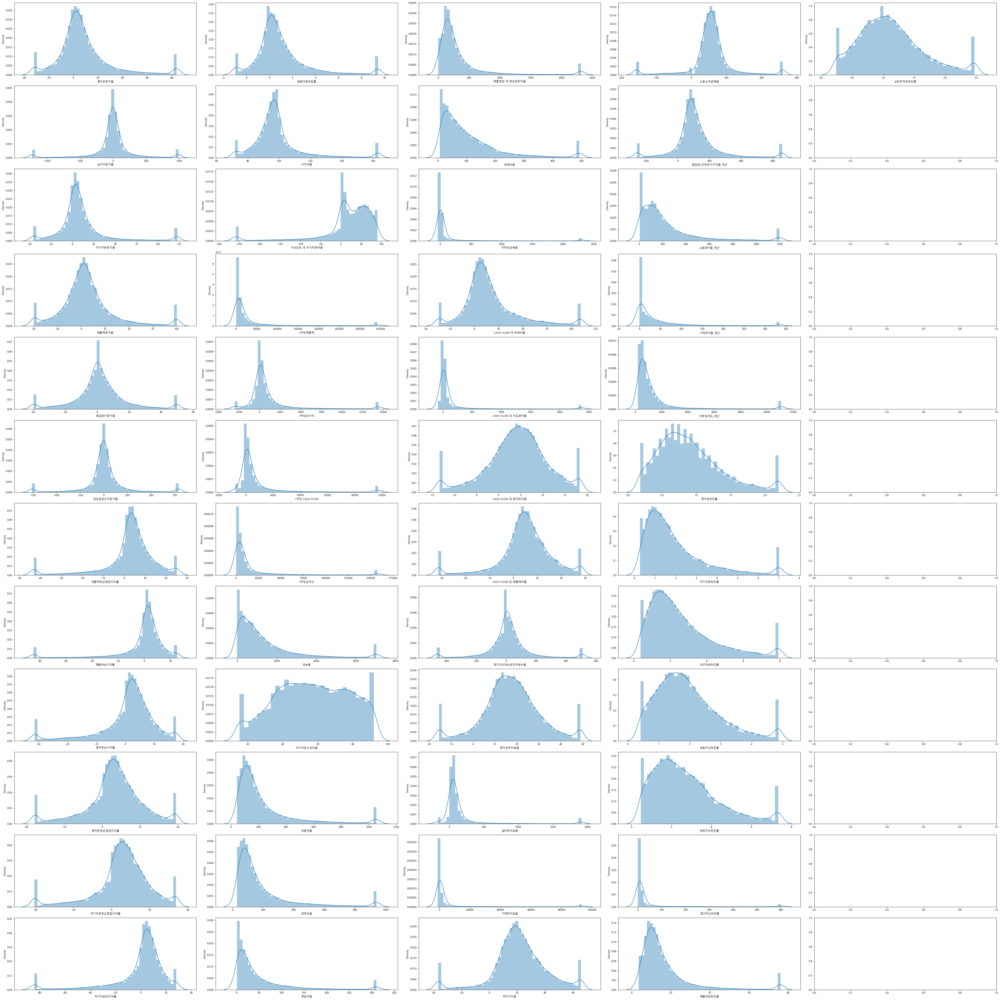

In [129]:
import numpy as np
import warnings
warnings.filterwarnings('ignore')
import matplotlib.pyplot as plt
%matplotlib inline

plt.rcParams['axes.unicode_minus'] = False
plt.rcParams["font.family"] = "Malgun Gothic"

ncols = 5
nrows = 12

fig, axs = plt.subplots(nrows, ncols, constrained_layout=True)
fig.set_size_inches((50, 50))

for col, ax in zip(wins_df_part5, axs.T.ravel()):
    sns.distplot(wins_df_part5[col], ax=ax)

plt.show()

### 윈저라이징 후 박스플롯

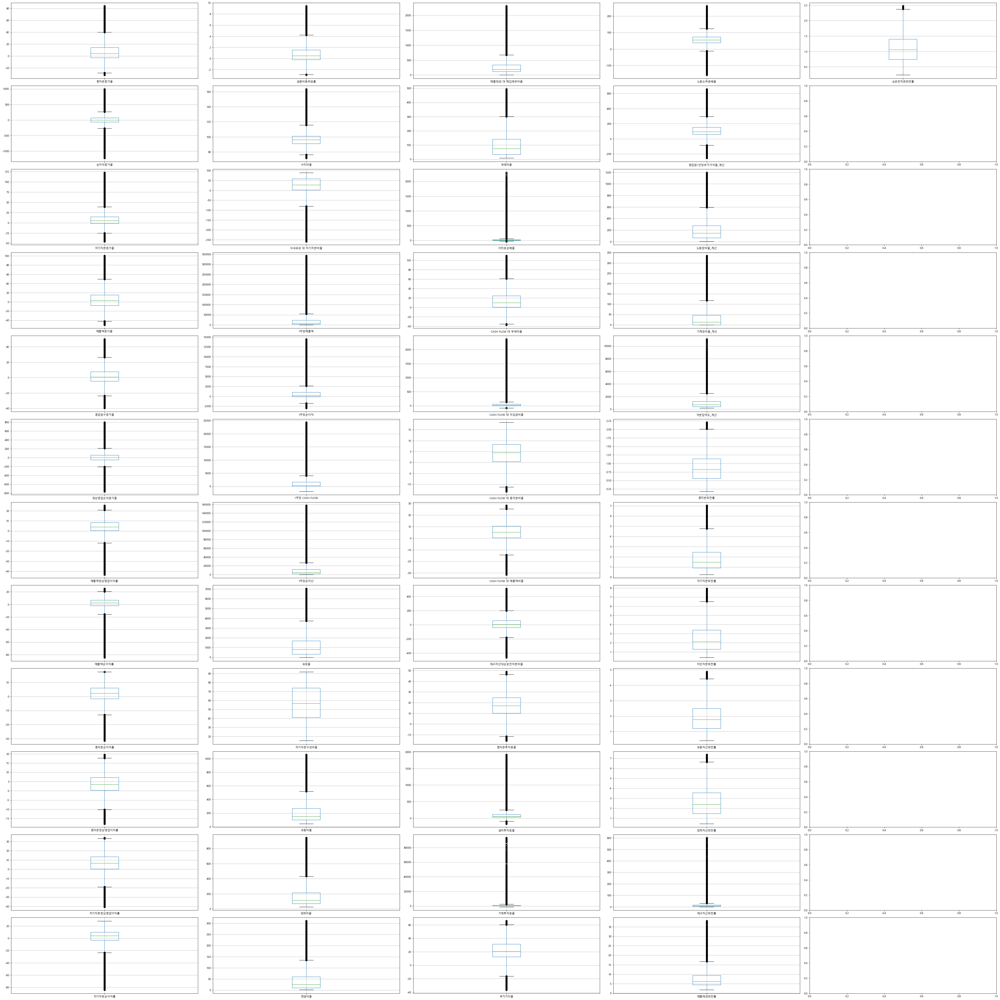

In [130]:
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

plt.rcParams['axes.unicode_minus'] = False
plt.rcParams["font.family"] = "Malgun Gothic"

ncols = 5
nrows = 12

fig, axs = plt.subplots(nrows, ncols, constrained_layout=True)
fig.set_size_inches((50, 50))

for col, ax in zip(wins_df_part5.columns, axs.T.ravel()):
    wins_df_part5[[col]].boxplot(ax=ax)

plt.show()

### 윈저라이징 후 Q-Q Plot

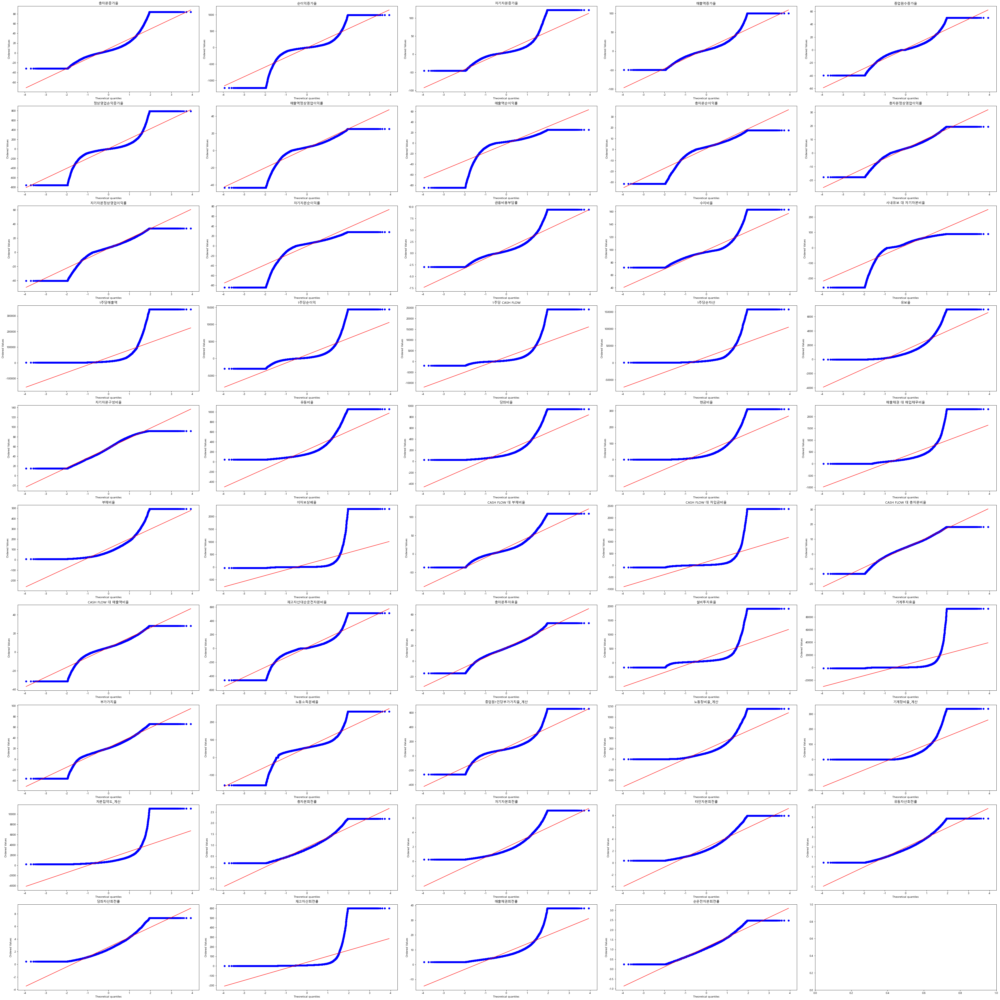

In [131]:
from scipy import stats

import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

plt.rcParams['axes.unicode_minus'] = False
plt.rcParams["font.family"] = "Malgun Gothic"

ncols = 5
nrows = 10

fig, axs = plt.subplots(nrows, ncols, constrained_layout=True)
fig.set_size_inches((50, 50))

for ax, i in zip(axs.ravel(), wins_df_part5):
        stats.probplot(wins_df_part5[i], dist='norm', plot=ax)
        ax.set_title(str(i))

plt.show()

### 윈저라이징 K-S Test

In [ ]:
import numpy as np
from scipy.stats import kstest

def ks_test(df_name):
    ks_columns = []
    ks_columns.append([col for col in df_name])
    for i in ks_columns:
        for j in i:
            ks_test = kstest(df_name[j], 'norm')
            print(j, "의 pvalue:", ks_test.pvalue)

In [132]:
ks_test(wins_df_part5)

총자본증가율 의 pvalue: 0.0
순이익증가율 의 pvalue: 0.0
자기자본증가율 의 pvalue: 0.0
매출액증가율 의 pvalue: 0.0
종업원수증가율 의 pvalue: 0.0
정상영업손익증가율 의 pvalue: 0.0
매출액정상영업이익률 의 pvalue: 0.0
매출액순이익률 의 pvalue: 0.0
총자본순이익률 의 pvalue: 0.0
총자본정상영업이익률 의 pvalue: 0.0
자기자본정상영업이익률 의 pvalue: 0.0
자기자본순이익률 의 pvalue: 0.0
금융비용부담률 의 pvalue: 0.0
수지비율 의 pvalue: 0.0
사내유보 대 자기자본비율 의 pvalue: 0.0
1주당매출액 의 pvalue: 0.0
1주당순이익 의 pvalue: 0.0
1주당 CASH FLOW 의 pvalue: 0.0
1주당순자산 의 pvalue: 0.0
유보율 의 pvalue: 0.0
자기자본구성비율 의 pvalue: 0.0
유동비율 의 pvalue: 0.0
당좌비율 의 pvalue: 0.0
현금비율 의 pvalue: 0.0
매출채권 대 매입채무비율 의 pvalue: 0.0
부채비율 의 pvalue: 0.0
이자보상배율 의 pvalue: 0.0
CASH FLOW 대 부채비율 의 pvalue: 0.0
CASH FLOW 대 차입금비율 의 pvalue: 0.0
CASH FLOW 대 총자본비율 의 pvalue: 0.0
CASH FLOW 대 매출액비율 의 pvalue: 0.0
재고자산대순운전자본비율 의 pvalue: 0.0
총자본투자효율 의 pvalue: 0.0
설비투자효율 의 pvalue: 0.0
기계투자효율 의 pvalue: 0.0
부가가치율 의 pvalue: 0.0
노동소득분배율 의 pvalue: 0.0
종업원1인당부가가치율_계산 의 pvalue: 0.0
노동장비율_계산 의 pvalue: 0.0
기계장비율_계산 의 pvalue: 0.0
자본집약도_계산 의 pvalue: 0.0
총자본회전률 의 pvalue: 0.0
자기자본회전률 의 pvalue: 0.0

### 윈저라이징 Shapiro–Wilk test

In [ ]:
# pvalue 함수

from scipy import stats
from scipy.stats import shapiro

# 등락률 컬럼만 추출해서 pvalue 구하는 함수
def shap_pct(df_name):
    pct_columns = []
    pct_columns.append([col for col in df_name])
    for i in pct_columns:
        for j in i:
            shapiro_test = shapiro(df_name[j])
            print(j, "의 pvalue:", shapiro_test.pvalue)

In [133]:
# 컬럼별 pvalue 값 출력
shap_pct(wins_df_part5)

총자본증가율 의 pvalue: 0.0
순이익증가율 의 pvalue: 0.0
자기자본증가율 의 pvalue: 0.0
매출액증가율 의 pvalue: 0.0
종업원수증가율 의 pvalue: 0.0
정상영업손익증가율 의 pvalue: 0.0
매출액정상영업이익률 의 pvalue: 0.0
매출액순이익률 의 pvalue: 0.0
총자본순이익률 의 pvalue: 0.0
총자본정상영업이익률 의 pvalue: 0.0
자기자본정상영업이익률 의 pvalue: 0.0
자기자본순이익률 의 pvalue: 0.0
금융비용부담률 의 pvalue: 0.0
수지비율 의 pvalue: 0.0
사내유보 대 자기자본비율 의 pvalue: 0.0
1주당매출액 의 pvalue: 0.0
1주당순이익 의 pvalue: 0.0
1주당 CASH FLOW 의 pvalue: 0.0
1주당순자산 의 pvalue: 0.0
유보율 의 pvalue: 0.0
자기자본구성비율 의 pvalue: 0.0
유동비율 의 pvalue: 0.0
당좌비율 의 pvalue: 0.0
현금비율 의 pvalue: 0.0
매출채권 대 매입채무비율 의 pvalue: 0.0
부채비율 의 pvalue: 0.0
이자보상배율 의 pvalue: 0.0
CASH FLOW 대 부채비율 의 pvalue: 0.0
CASH FLOW 대 차입금비율 의 pvalue: 0.0
CASH FLOW 대 총자본비율 의 pvalue: 3.253815034162225e-42
CASH FLOW 대 매출액비율 의 pvalue: 0.0
재고자산대순운전자본비율 의 pvalue: 0.0
총자본투자효율 의 pvalue: 4.6929485570238124e-42
설비투자효율 의 pvalue: 0.0
기계투자효율 의 pvalue: 0.0
부가가치율 의 pvalue: 0.0
노동소득분배율 의 pvalue: 0.0
종업원1인당부가가치율_계산 의 pvalue: 0.0
노동장비율_계산 의 pvalue: 0.0
기계장비율_계산 의 pvalue: 0.0
자본집약도_계산 의 pvalue: 0.0
총자본회전

### 윈저라이징 등분산, 이분산 확인

In [135]:
wins_df_part5['부실기업'] = df_part5_final.iloc[:, 7]
wins_df_part5.head(5)

,총자본증가율,순이익증가율,자기자본증가율,매출액증가율,종업원수증가율,정상영업손익증가율,매출액정상영업이익률,매출액순이익률,총자본순이익률,총자본정상영업이익률,...,자본집약도_계산,총자본회전률,자기자본회전률,타인자본회전률,유동자산회전률,당좌자산회전률,재고자산회전률,매출채권회전률,순운전자본회전률,부실기업
0,13.166482,80.280163,5.219839,56.396905,4.65,790.705855,3.61,-8.50,-5.58,2.37,...,204.066667,0.66,0.984333,2.01,1.25,1.55,6.42,2.45,0.86,0
1,83.900297,-341.571868,75.170505,-8.429134,-0.74,-756.819406,-25.87,-40.97,-15.78,-9.96,...,425.291045,0.39,0.655130,0.93,0.52,0.57,5.71,1.85,0.42,0
2,-2.093352,988.410676,55.100407,25.510008,1.49,631.501169,3.88,1.45,0.52,1.40,...,411.485294,0.36,0.506332,1.26,0.48,0.52,5.39,2.07,0.42,0
3,3.855597,-46.641074,0.010946,11.520576,20.59,-44.098325,1.94,0.69,0.28,0.78,...,354.432927,0.40,0.464339,2.85,0.68,0.80,4.77,1.86,0.56,0
4,-2.644307,-1224.217317,-4.480893,18.851969,-4.88,-681.514824,-9.51,-13.50,-6.37,-4.49,...,362.769231,0.47,0.564493,2.88,0.99,1.22,5.22,2.10,0.75,0


In [136]:
# from scipy.stats import bartlett
from scipy.stats import levene

homosced = []
heterosced = []

lev_df = wins_df_part5.iloc[:, :-1]

nc_df = wins_df_part5[wins_df_part5['부실기업'] ==0]  # normal company 
bc_df = wins_df_part5[wins_df_part5['부실기업'] ==1]  # bankrupt company

lev_sced_df = pd.DataFrame(index=['등분산성'])

for i in lev_df.columns:
    lev_sced_df[i] = ''
    
    ser_1 = nc_df[i]
    ser_2 = bc_df[i]

    lresult = np.round(levene(ser_1, ser_2)[1], 3)
    
    if lresult < 0.05:
        homosced.append(i)
        lev_sced_df.loc['등분산성', i] = '등분산'
        print(i,"pvalue", lresult,"-> 등분산")
    else:
        heterosced.append(i)
        lev_sced_df.loc['등분산성', i] = '이분산'
        print(i,"pvalue", lresult,"-> 이분산")
        
    print("**********************************************************")

총자본증가율 pvalue 0.0 -> 등분산
**********************************************************
순이익증가율 pvalue 0.0 -> 등분산
**********************************************************
자기자본증가율 pvalue 0.0 -> 등분산
**********************************************************
매출액증가율 pvalue 0.0 -> 등분산
**********************************************************
종업원수증가율 pvalue 0.0 -> 등분산
**********************************************************
정상영업손익증가율 pvalue 0.0 -> 등분산
**********************************************************
매출액정상영업이익률 pvalue 0.0 -> 등분산
**********************************************************
매출액순이익률 pvalue 0.0 -> 등분산
**********************************************************
총자본순이익률 pvalue 0.0 -> 등분산
**********************************************************
총자본정상영업이익률 pvalue 0.0 -> 등분산
**********************************************************
자기자본정상영업이익률 pvalue 0.0 -> 등분산
**********************************************************
자기자본순이익률 pvalue 0.0 -> 등분산
*****************************

In [137]:
# 피처별 등분산성 데이터프레임 생성
lev_sced_df = lev_sced_df.transpose()
lev_sced_df

,등분산성
총자본증가율,등분산
순이익증가율,등분산
자기자본증가율,등분산
매출액증가율,등분산
종업원수증가율,등분산
정상영업손익증가율,등분산
매출액정상영업이익률,등분산
매출액순이익률,등분산
총자본순이익률,등분산
총자본정상영업이익률,등분산


In [138]:
lev_sced_df.value_counts()

등분산성
등분산     44
이분산      5
dtype: int64

### 윈저라이징 Welch's ttest_ind

In [139]:
import numpy as np
from scipy.stats import ttest_ind

welch_df = wins_df_part5.iloc[:, :-1]

nc_df = wins_df_part5.iloc[:, :-1][wins_df_part5['부실기업'] ==0]  # normal company 
bc_df = wins_df_part5.iloc[:, :-1][wins_df_part5['부실기업'] ==1]  # bankrupt company

# 등분산성 Welch's T-test
def ttest_homo(df_name1, df_name2):
    for i in welch_df.columns:
        welch_result = ttest_ind(df_name1[i], df_name2[i], equal_var=True)
        print("등분산을 가정한", i, "의 pvalue:", np.round(welch_result.pvalue, 3))
    
        print("**********************************************************")

In [140]:
ttest_homo(nc_df, bc_df)

등분산을 가정한 총자본증가율 의 pvalue: 0.0
**********************************************************
등분산을 가정한 순이익증가율 의 pvalue: 0.0
**********************************************************
등분산을 가정한 자기자본증가율 의 pvalue: 0.0
**********************************************************
등분산을 가정한 매출액증가율 의 pvalue: 0.0
**********************************************************
등분산을 가정한 종업원수증가율 의 pvalue: 0.0
**********************************************************
등분산을 가정한 정상영업손익증가율 의 pvalue: 0.0
**********************************************************
등분산을 가정한 매출액정상영업이익률 의 pvalue: 0.0
**********************************************************
등분산을 가정한 매출액순이익률 의 pvalue: 0.0
**********************************************************
등분산을 가정한 총자본순이익률 의 pvalue: 0.0
**********************************************************
등분산을 가정한 총자본정상영업이익률 의 pvalue: 0.0
**********************************************************
등분산을 가정한 자기자본정상영업이익률 의 pvalue: 0.0
**********************************************************
등

In [ ]:
# 이분산성 Welch's T-test
def ttest_hetero(df_name1, df_name2):
    for i in welch_df.columns:
        welch_result = ttest_ind(df_name1[i], df_name2[i], equal_var=False)
        print("이분산을 가정한", i, "의 pvalue:", np.round(welch_result.pvalue, 3))
    
        print("**********************************************************")

In [141]:
ttest_hetero(nc_df, bc_df)

이분산을 가정한 총자본증가율 의 pvalue: 0.0
**********************************************************
이분산을 가정한 순이익증가율 의 pvalue: 0.0
**********************************************************
이분산을 가정한 자기자본증가율 의 pvalue: 0.0
**********************************************************
이분산을 가정한 매출액증가율 의 pvalue: 0.0
**********************************************************
이분산을 가정한 종업원수증가율 의 pvalue: 0.0
**********************************************************
이분산을 가정한 정상영업손익증가율 의 pvalue: 0.0
**********************************************************
이분산을 가정한 매출액정상영업이익률 의 pvalue: 0.0
**********************************************************
이분산을 가정한 매출액순이익률 의 pvalue: 0.0
**********************************************************
이분산을 가정한 총자본순이익률 의 pvalue: 0.0
**********************************************************
이분산을 가정한 총자본정상영업이익률 의 pvalue: 0.0
**********************************************************
이분산을 가정한 자기자본정상영업이익률 의 pvalue: 0.0
**********************************************************
이

## OLS

In [ ]:
import statsmodels.api as sm

model = sm.OLS(df_part5_final['부실기업'], df_part5_final.iloc[:, 10:])
results = model.fit()
print(results.summary())

                                 OLS Regression Results                                
Dep. Variable:                   부실기업   R-squared (uncentered):                   0.441
Model:                            OLS   Adj. R-squared (uncentered):              0.439
Method:                 Least Squares   F-statistic:                              267.9
Date:                Mon, 26 Sep 2022   Prob (F-statistic):                        0.00
Time:                        20:03:28   Log-Likelihood:                         -5087.9
No. Observations:               16705   AIC:                                  1.027e+04
Df Residuals:                   16656   BIC:                                  1.065e+04
Df Model:                          49                                                  
Covariance Type:            nonrobust                                                  
                        coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------

## 상관관계

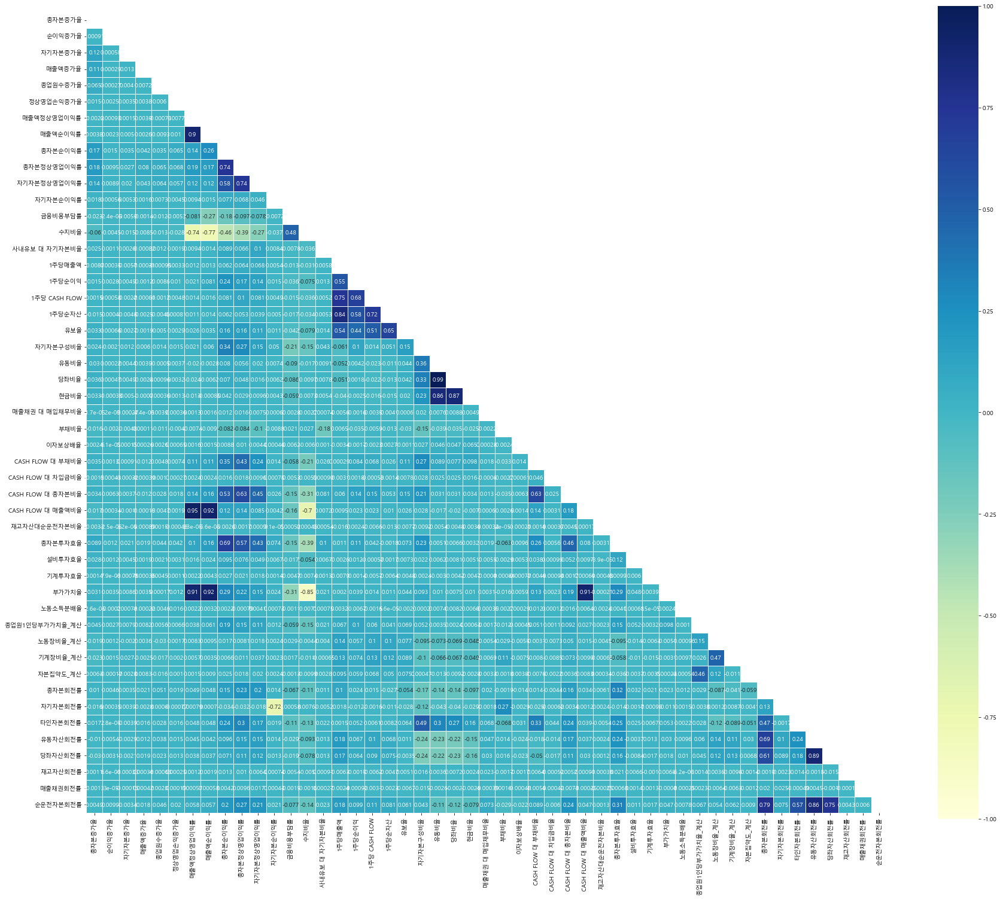

In [ ]:
# 상관계수 히트맵

import seaborn as sns
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

plt.rcParams['axes.unicode_minus'] = False
plt.rcParams["font.family"] = "Malgun Gothic"

plt.figure(figsize=(30,25))

df_part4_corr = df_part5_final.iloc[:, 10:].corr()

mask = np.zeros_like(df_part4_corr, dtype=np.bool)
mask[np.triu_indices_from(mask)] = True

sns.heatmap(df_part5_final.iloc[:, 10:].corr(), annot=True, mask=mask, linewidths=.5, cmap="YlGnBu", square=True, vmin=-1, vmax=1)

plt.show()

In [ ]:
# VIF

import pandas as pd
import statsmodels.api as sm
from statsmodels.stats.outliers_influence import variance_inflation_factor

def feature_engineering_XbyVIF(df_cols):
    vif = pd.DataFrame()
    vif['VIF_Factor'] = [variance_inflation_factor(df_cols.values, i)
                        for i in range(df_cols.shape[1])]
    vif['Feature'] = df_cols.columns
    return vif

In [ ]:
feature_vif = feature_engineering_XbyVIF(df_part5_final.iloc[:, 10:])
feature_vif

,VIF_Factor,Feature
0,1.162506,총자본증가율
1,1.000713,순이익증가율
2,1.019740,자기자본증가율
3,1.027184,매출액증가율
4,1.017647,종업원수증가율
5,1.007149,정상영업손익증가율
6,19.546007,매출액정상영업이익률
7,10.649268,매출액순이익률
8,4.379977,총자본순이익률
9,5.186346,총자본정상영업이익률


In [ ]:
feature_vif_df = pd.DataFrame(feature_vif)
feature_vif_df.sort_values('VIF_Factor', ascending=False)

,VIF_Factor,Feature
21,121.692306,유동비율
22,113.238870,당좌비율
48,50.103797,순운전자본회전률
44,43.647322,유동자산회전률
6,19.546007,매출액정상영업이익률
30,19.403178,CASH FLOW 대 매출액비율
45,17.885069,당좌자산회전률
35,16.837560,부가가치율
13,14.108056,수지비율
41,13.950278,총자본회전률
